# Clustering of all gastruloid data

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from anndata import AnnData, read_h5ad
import singlecellmultiomics.bamProcessing.bamToRNACounts

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

/Users/m.blotenburg/miniconda2/envs/conda/lib/python3.6/site-packages/anndata/base.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4.1 anndata==0.6.19 numpy==1.18.2 scipy==1.2.1 pandas==1.0.2 scikit-learn==0.21.3 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


In [2]:
sc.settings.set_figure_params(dpi=80)


# Load the dataset

In [3]:
pathToData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Transcriptome_analysis/120hAA/20190904_CS2pipeOutput_RNAVelocity_VAN2663_VAN2703_VAN2806_VAN3423_OUD3693/CS2pipe_datasets/120hAA/'

In [4]:
df120 = pd.read_pickle(pathToData + '120hAA_Transcriptome_dataFrame_FACS2507_FACS0108_allplates.pickle.gz')

In [5]:
results_file = pathToData + '/write/dataset120hAA.h5ad'  # the file that will store the analysis results

In [6]:
df120.head()

,A1_1.C5A4,A1_10.C5C3,A1_100.C5C3,A1_101.C5C3,A1_102.C5C3,A1_103.C5C3,A1_104.C5C3,A1_105.C5C3,A1_106.C5C3,A1_107.C5C3,...,H2_90.C5F10,H2_91.C5F10,H2_92.C5F10,H2_93.C5F10,H2_94.C5F10,H2_95.C5F10,H2_96.C5F10,H2_97.C5F10,H2_98.C5F10,H2_99.C5F10
ENSMUSG00000000028_16,NaN,4.0,1.0,NaN,2.0,NaN,NaN,2.0,2.0,3.0,...,NaN,1.0,1.0,2.0,NaN,1.0,NaN,1.0,3.0,NaN
ENSMUSG00000000031_7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
ENSMUSG00000000037_X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSMUSG00000000056_11,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN
ENSMUSG00000000078_13,NaN,1.0,4.0,NaN,NaN,1.0,NaN,NaN,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,3.0,1.0,NaN,2.0


In [7]:
df120 = df120.fillna(0)

In [8]:
print('Dataset 120hAA')
print(df120.shape)

Dataset 120hAA
(16258, 4600)


In [9]:
df120 = df120.loc[df120.index.dropna()]

In [10]:
df120 = df120.astype(float)

In [11]:
adata_120 = sc.AnnData(df120.transpose())

In [12]:
adata=adata_120

# Preprocessing of dataset 1 - 120h AA

make gene names more workable

In [13]:
adata.var.index = adata.var.index.str.split('_',0,expand=True)

In [14]:
adata.var.head()

,
ENSMUSG00000000028,16
ENSMUSG00000000031,7
ENSMUSG00000000037,X
ENSMUSG00000000056,11
ENSMUSG00000000078,13


In [15]:
index = adata.var.reset_index(level=(1))
index = index.rename(index=str, columns={"level_1": "chromosome"})
index.head()

,chromosome
ENSMUSG00000000028,16
ENSMUSG00000000031,7
ENSMUSG00000000037,X
ENSMUSG00000000056,11
ENSMUSG00000000078,13


In [16]:
index.index

Index(['ENSMUSG00000000028', 'ENSMUSG00000000031', 'ENSMUSG00000000037',
       'ENSMUSG00000000056', 'ENSMUSG00000000078', 'ENSMUSG00000000085',
       'ENSMUSG00000000088', 'ENSMUSG00000000093', 'ENSMUSG00000000094',
       'ENSMUSG00000000120',
       ...
       'ENSMUSG00000117597', 'ENSMUSG00000117599', 'ENSMUSG00000117600',
       'ENSMUSG00000117619', 'ENSMUSG00000117621', 'ENSMUSG00000117628',
       'ENSMUSG00000117634', 'ENSMUSG00000117639', 'ENSMUSG00000117651',
       'ENSMUSG00000117653'],
      dtype='object', length=16258)

In [17]:
index['ensembl'] = index.index

In [18]:
adata.var.index = index.index

In [19]:
adata.var['ensembl'] = index['ensembl']
adata.var['chromosome'] = index['chromosome']

In [20]:
conversion_table = singlecellmultiomics.bamProcessing.bamToRNACounts.get_gene_id_to_gene_name_conversion_table('/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/RNAvelocity/exons.gtf.gz')

In [21]:
adata.var_names = np.array([conversion_table.get(x,x) for x in adata.var_names ])

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [22]:
adata.var_names_make_unique()

In [23]:
adata.var.head()

,ensembl,chromosome
Cdc45,ENSMUSG00000000028,16
H19,ENSMUSG00000000031,7
Scml2,ENSMUSG00000000037,X
Narf,ENSMUSG00000000056,11
Klf6,ENSMUSG00000000078,13


Show those genes that yield the highest fraction of counts in each single cells, across all cells.

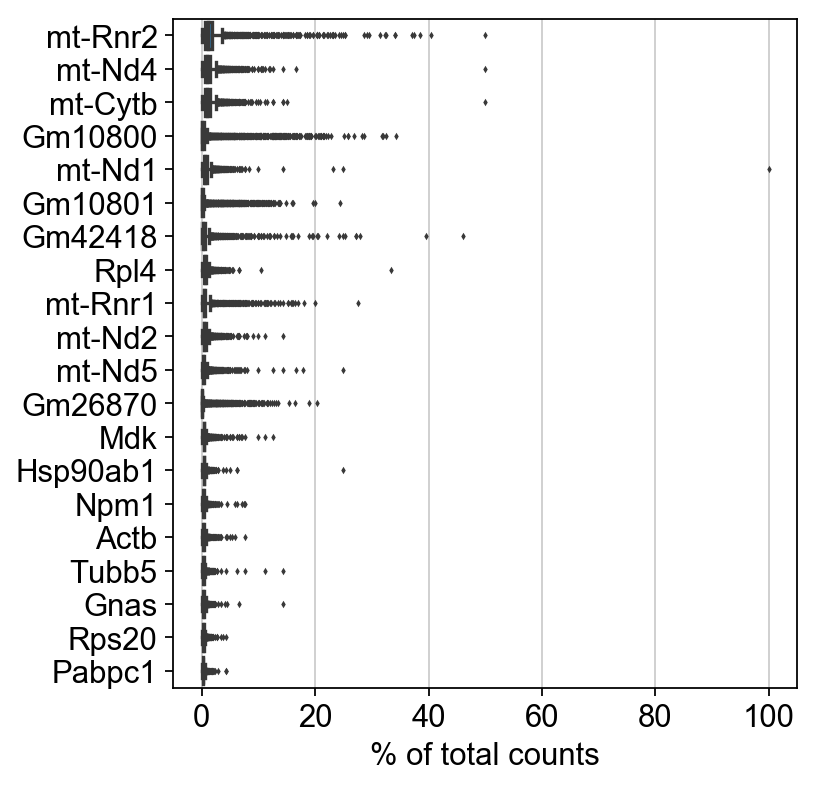

In [24]:
sc.pl.highest_expr_genes(adata, n_top=20)

Basic filtering.

In [25]:
adata

AnnData object with n_obs × n_vars = 4600 × 16258 
    var: 'ensembl', 'chromosome'

In [26]:
adata.write("adata_20190904.h5ad")

... storing 'chromosome' as categorical


# To load adata file with corrected gene names and continue:

In [27]:
adata = sc.read("adata_20190904.h5ad")

In [28]:
adata

AnnData object with n_obs × n_vars = 4600 × 16258 
    var: 'ensembl', 'chromosome'

In [29]:
minCount = 1000
sc.pp.filter_cells(adata, min_counts=minCount)
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=2)

filtered out 1069 cells that have less than 1000 counts


Let us assemple some information about mitochondrial genes, which are important for quality control.

Citing from "Simple Single Cell" workflows [(Lun, McCarthy & Marioni, 2017)](https://master.bioconductor.org/packages/release/workflows/html/simpleSingleCell.html#examining-gene-level-metrics):

> High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

Note you can also use the function `pp.calculate_qc_metrics` to compute the fraction of mitochondrial genes and additional measures.

In [30]:
mito_genes = adata.var_names.str.startswith('mt-')

# for each cell compute fraction of counts in mito genes vs. all genes
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1)

A violin plot of the computed quality measures.

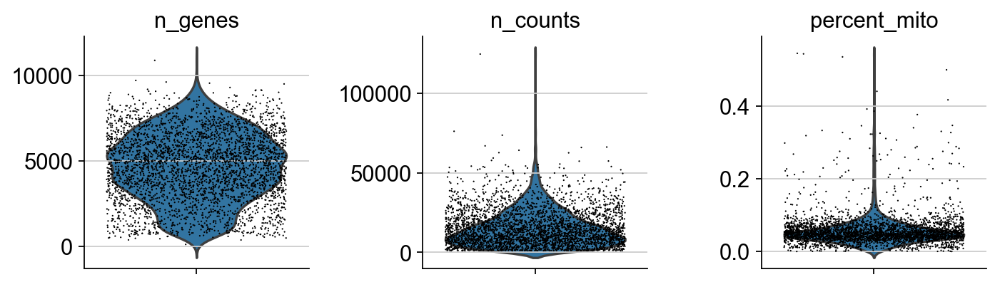

In [31]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts.

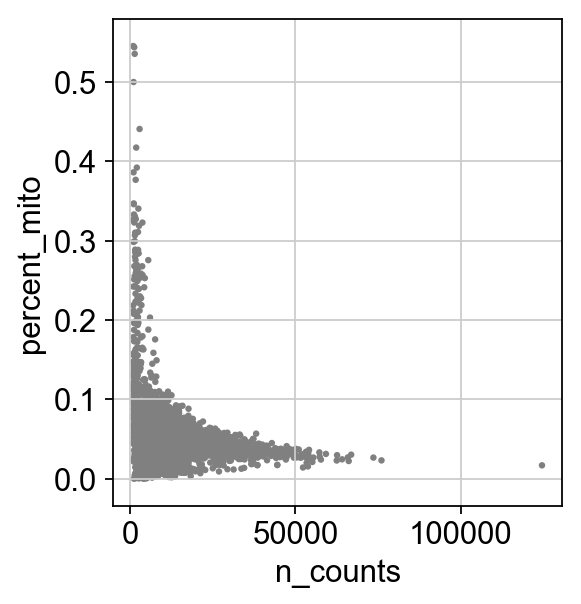

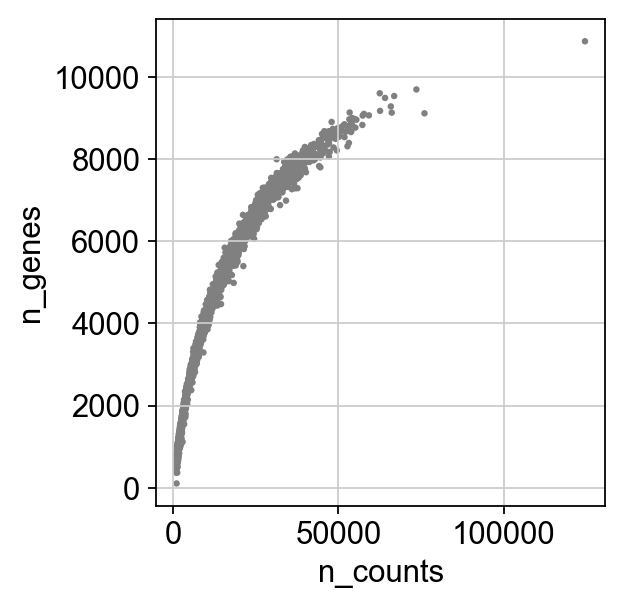

In [32]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [33]:
adata

AnnData object with n_obs × n_vars = 3531 × 16258 
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells'

Actually do the filtering.

In [34]:
adata = adata[adata.obs['percent_mito'] < 0.15, :]

throw out any other unwanted genes

In [35]:
# removing genes with annotations we are not interested in
banned = ['NA', 'mt-', "Malat1", 'Rpl', 'Rps']
keptGenes = [geneName for geneName in adata.var.index if not any( (b in geneName for b in banned) )]

adata = adata[:,keptGenes]

adata

View of AnnData object with n_obs × n_vars = 3433 × 15953 
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells'

minCount = 1000
sc.pp.filter_cells(adata, min_counts=minCount)
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=2)

Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.

In [36]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=minCount)

Logarithmize the data.

In [37]:
sc.pp.log1p(adata)

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object. While many people consider the normalized data matrix as the "relevant data" for visualization and differential testing, some would prefer to store the unnormalized data.

In [38]:
adata.raw = adata

Identify highly-variable genes.

In [39]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


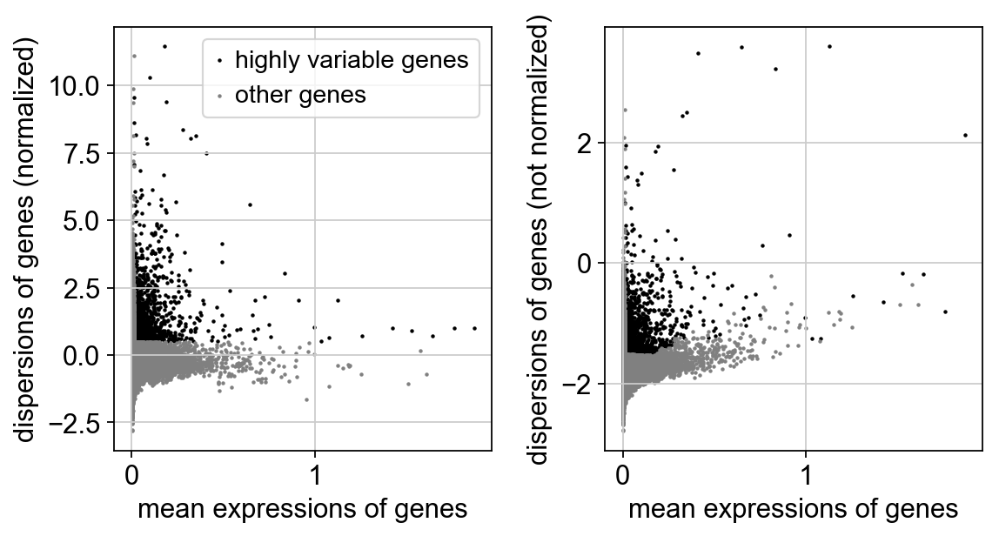

In [40]:
sc.pl.highly_variable_genes(adata)

Actually do the filtering.

In [41]:
adata = adata[:, adata.var['highly_variable']]

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [42]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    finished (0:00:04.92)


Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

In [43]:
sc.pp.scale(adata, max_value=10)

filtered out 2050 cells that have less than 1 counts


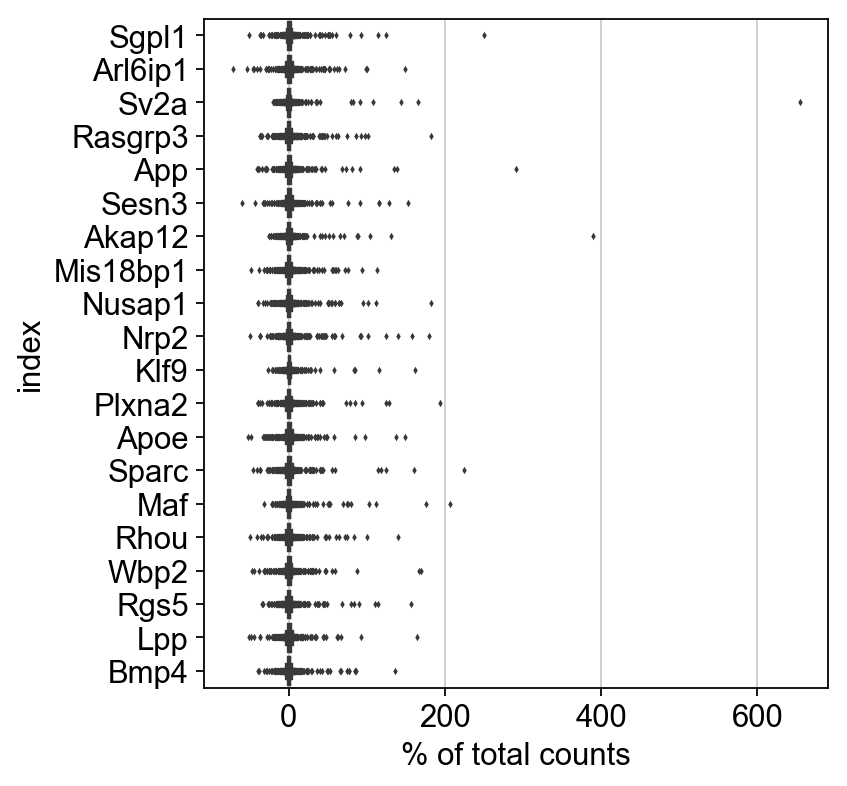

In [44]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [45]:
adata

AnnData object with n_obs × n_vars = 3433 × 1265 
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

## Principal component analysis

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [46]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA on highly variable genes


We can make a scatter plot in the PCA coordinates, but we will not use that later on.

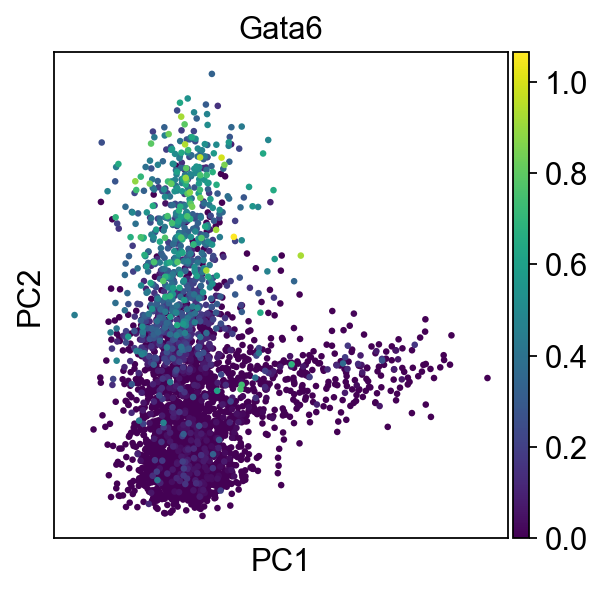

In [47]:
plotgene = [geneName for geneName in adata.var.index if any( (b in geneName for b in ['Gata6']) )]
sc.pl.pca(adata, color=plotgene)

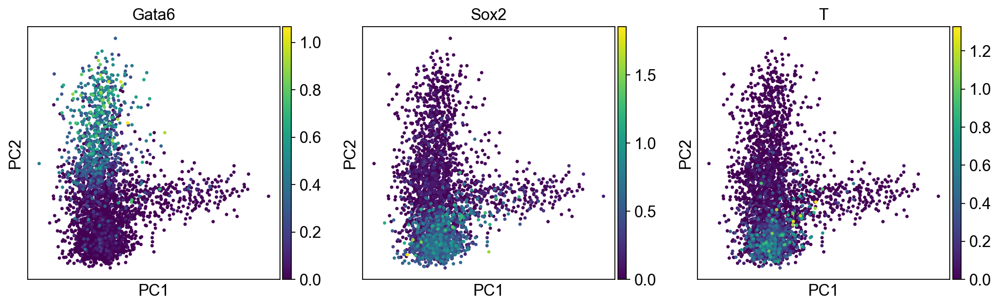

In [48]:
sc.pl.pca(adata, color=['Gata6','Sox2','T'])

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

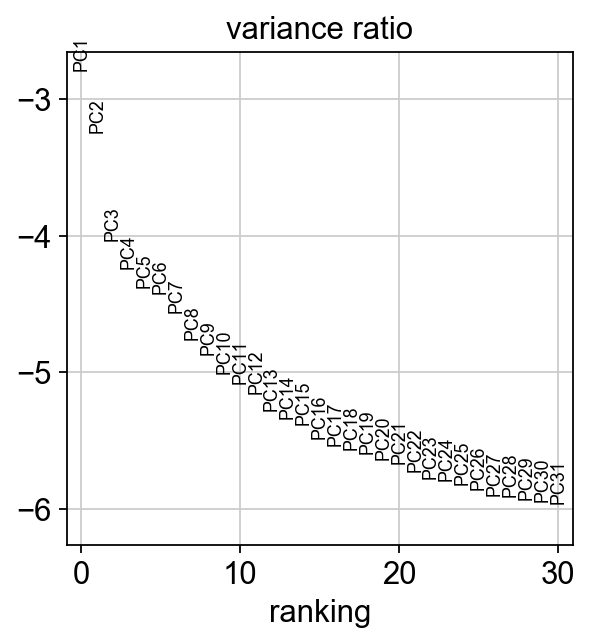

In [49]:
sc.pl.pca_variance_ratio(adata, log=True)

Save the result.

In [50]:
adata.write(results_file)

In [51]:
adata

AnnData object with n_obs × n_vars = 3433 × 1265 
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values.

In [52]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:04.91) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


## Embedding the neighborhood graph

We advertise embedding the graph in 2 dimensions using UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)), see below. It is  potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preservers trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

```
tl.paga(adata)
pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
tl.umap(adata, init_pos='paga')
```

In [53]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:05.92) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [54]:
batches = [ob.split('.')[1] for ob in adata.obs_names]
batches = [ob.split('_')[0] for ob in batches]

adata.obs['batch'] = batches

... storing 'batch' as categorical


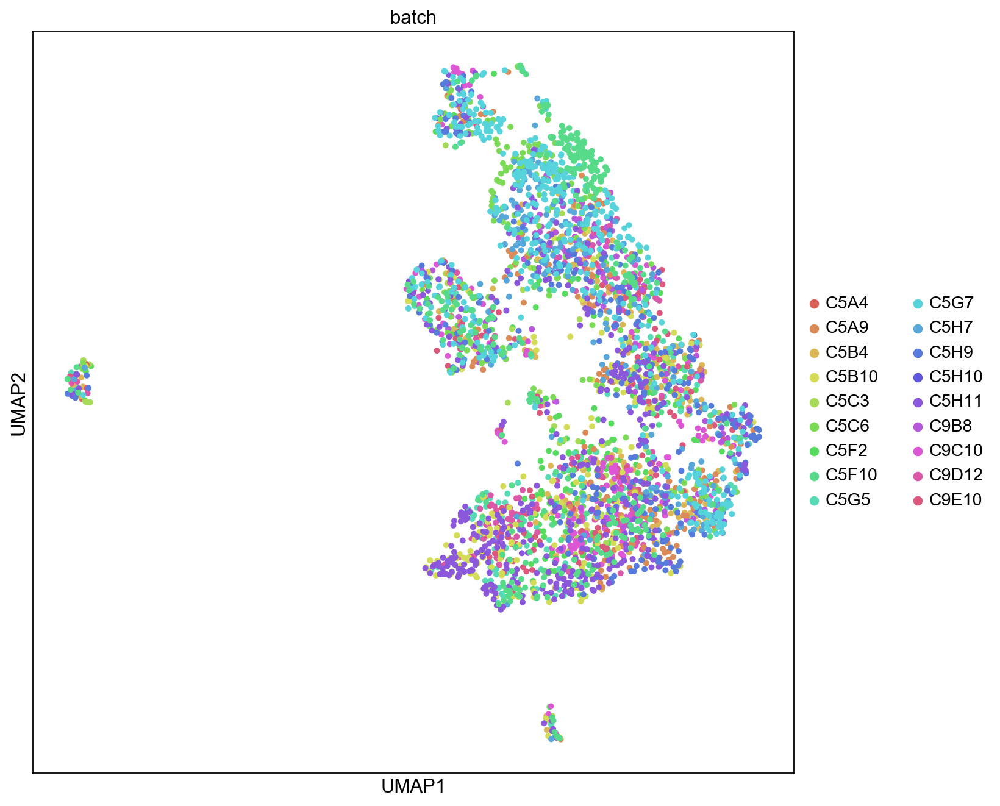

In [55]:
fig, ax = plt.subplots(figsize=(10,10))

ax=sc.pl.umap(adata, color='batch',ax=ax, palette=sns.color_palette("hls", 18),size=80)

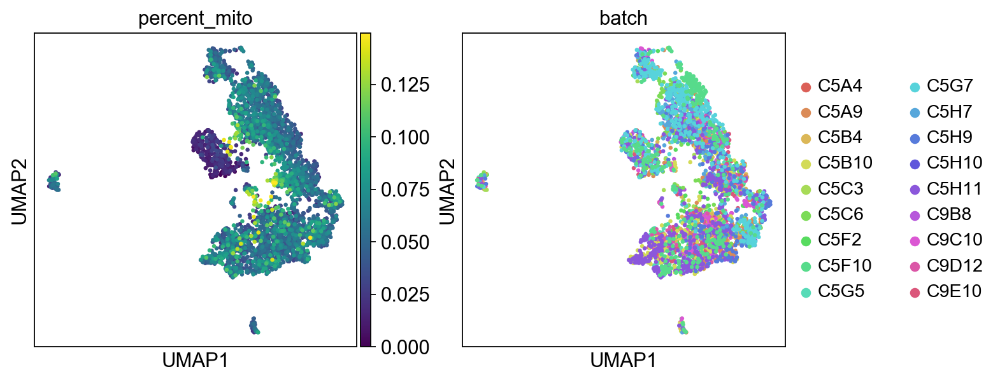

In [57]:
sc.pl.umap(adata, color=['percent_mito', 'batch'], use_raw=True)

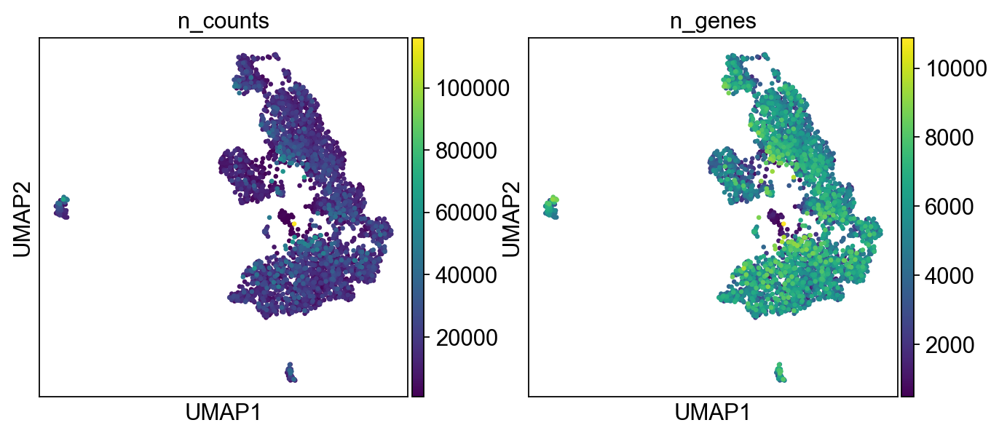

In [58]:
sc.pl.umap(adata, color=['n_counts', 'n_genes'], use_raw=True)

As we set the `.raw` attribute of `adata`, the previous plots showed the "raw" (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use `.raw`.

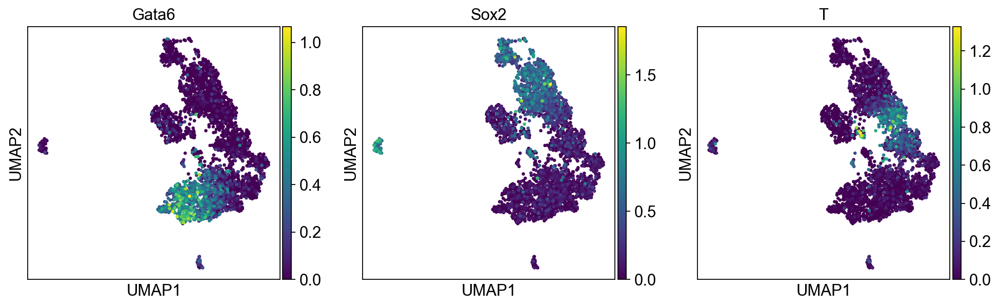

In [60]:
sc.pl.umap(adata, color=['Gata6', 'Sox2', 'T'], use_raw=True)

## Clustering the neighborhood graph

As Seurat and many others, we recommend the Louvain graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by [Levine et al. (2015)](https://doi.org/10.1016/j.cell.2015.05.047). Note that Louvain clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [61]:
sc.tl.louvain(adata)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.28) --> found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


In [62]:
sc.tl.leiden(adata)

running Leiden clustering
    finished (0:00:00.94) --> found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


Plot the clusters, which agree quite well with the result of Seurat.

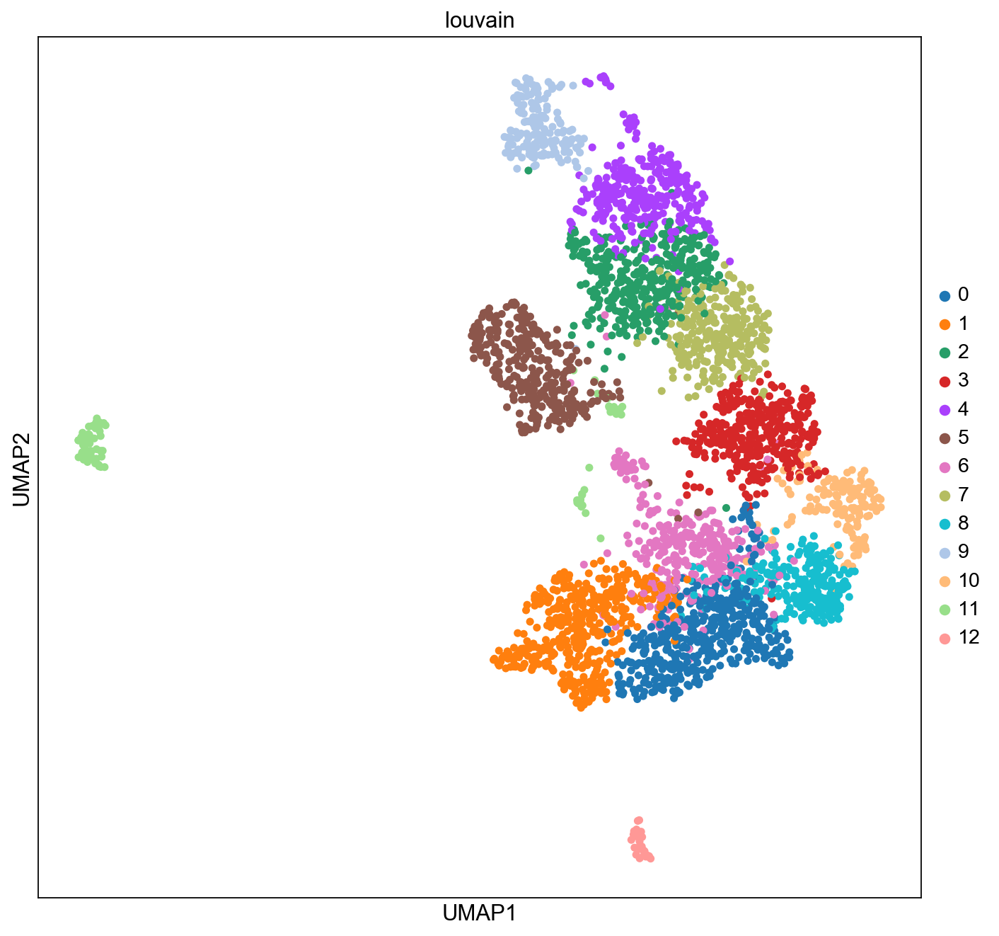

In [63]:
fig, ax = plt.subplots(figsize=(10,10))
sc.pl.umap(adata, color='louvain',ax=ax, palette=sc.pl.palettes.default_20,size=100)



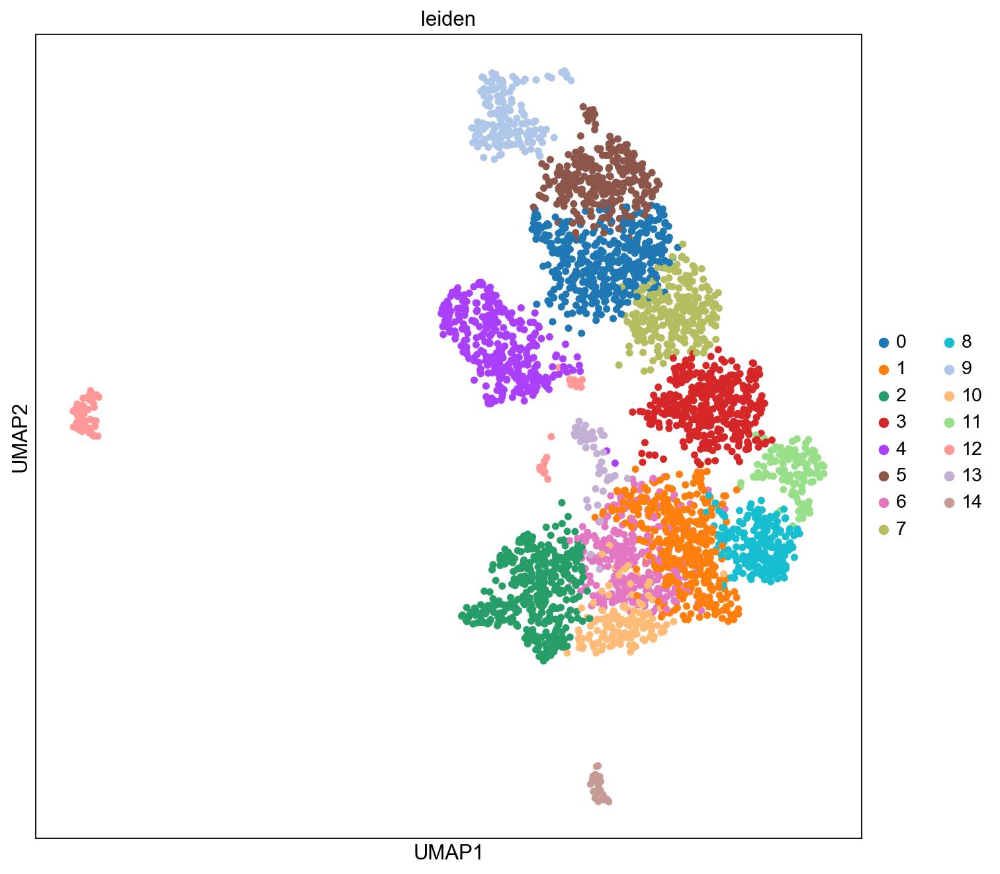

In [64]:
fig, ax = plt.subplots(figsize=(10,10))
sc.pl.umap(adata, color='leiden',ax=ax, palette=sc.pl.palettes.default_20,size=100)

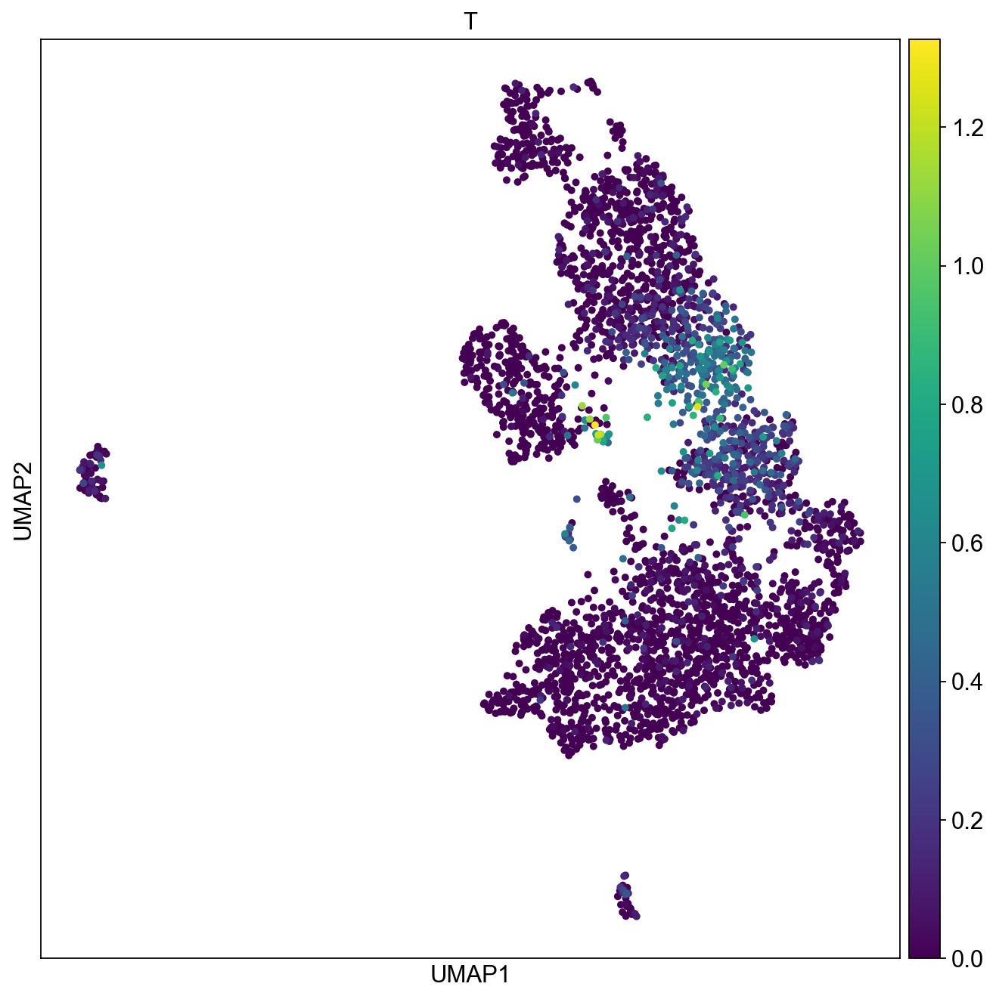

In [65]:
fig, ax = plt.subplots(figsize=(10,10))
ax = sc.pl.umap(adata, color=['T'], ax=ax, use_raw=True, size=80)


Save the result.

In [69]:
adata.write(results_file)

Make a violin plot of all highly variable genes.

In [71]:
#sc.pl.stacked_violin(adata, figsize = (12,6),palette = sns.color_palette('winter', 42), var_names = adata.var_names[adata.var['highly_variable'] & (np.log(adata.var['means'])>-1)])
#palette=sc.pl.palettes.default_64,

You can also make a heatmap. ! this takes a bit of time to compute.

In [252]:
#sc.pl.heatmap(adata, var_names = adata.var_names[adata.var['highly_variable'] & (np.log(adata.var['means'])>-1)])

## Finding marker genes

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

ranking genes
    finished (0:00:04.04) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


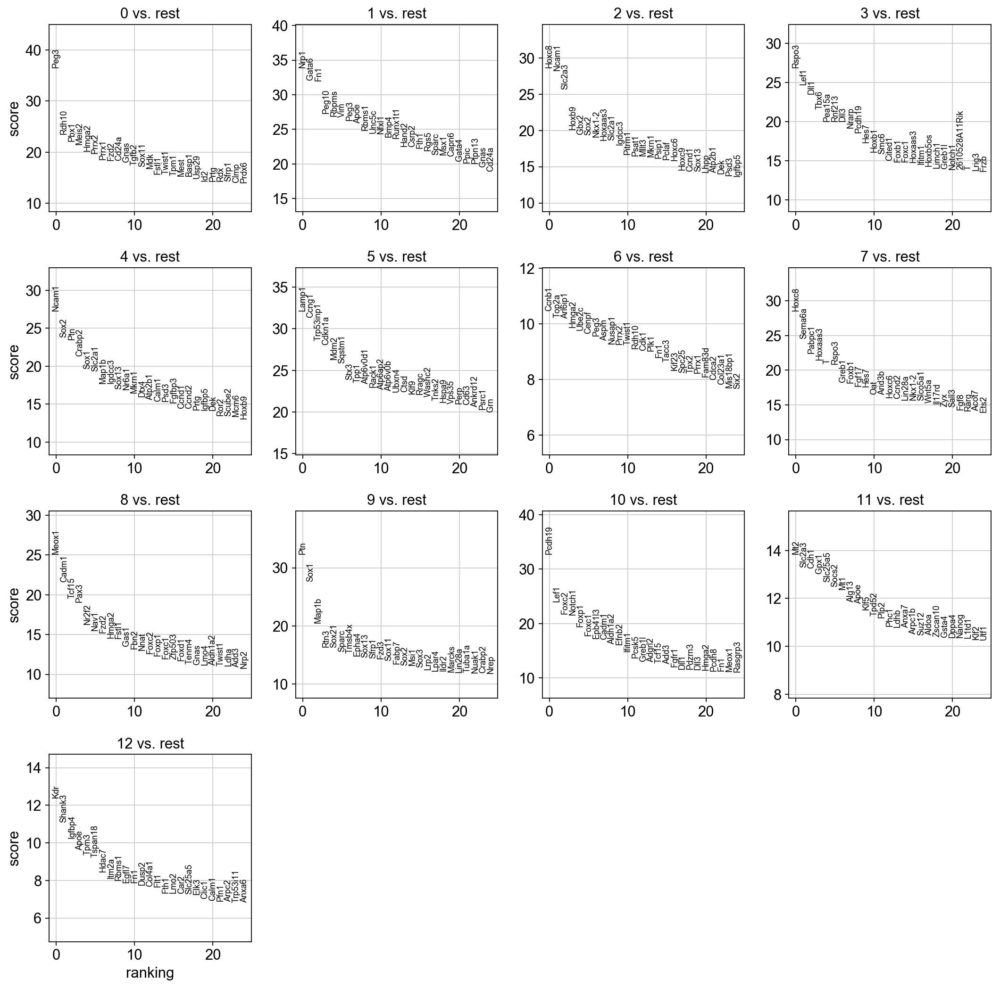

In [72]:
sc.tl.rank_genes_groups(adata, 'louvain', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [73]:
sc.settings.verbosity = 2  # reduce the verbosity

The result of a [Wilcoxon rank-sum (Mann-Whitney-U)](https://de.wikipedia.org/wiki/Wilcoxon-Mann-Whitney-Test) test is very similar. We recommend using the latter in publications, see e.g., [Sonison & Robinson (2018)](https://doi.org/10.1038/nmeth.4612). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished (0:00:08.38)


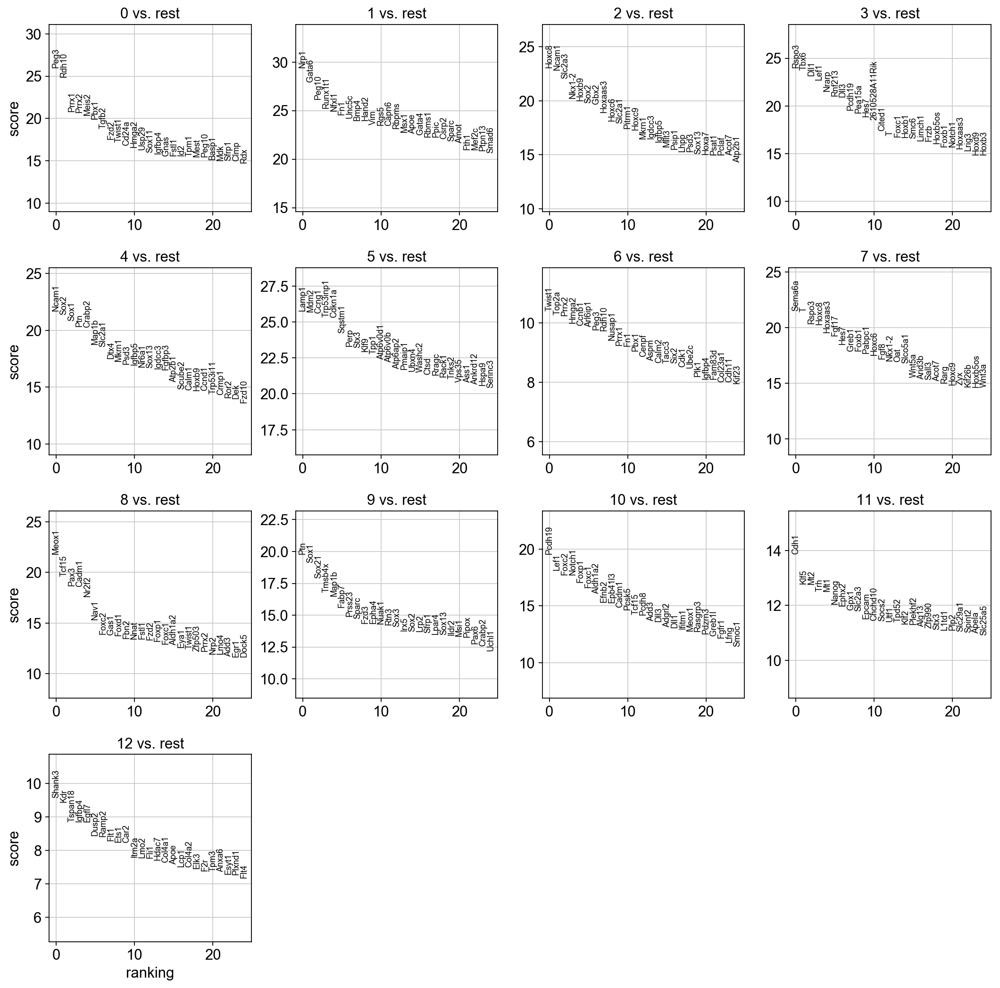

In [74]:
sc.tl.rank_genes_groups(adata, 'louvain', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Save the result.

In [75]:
adata.write(results_file)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by [Natranos et al. (2018)](https://doi.org/10.1101/258566). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. [Clark et al. (2014)](https://doi.org/10.1186/1471-2105-15-79) has more details.

ranking genes


/Users/m.blotenburg/miniconda2/envs/conda/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/m.blotenburg/miniconda2/envs/conda/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


    finished (0:00:36.35)


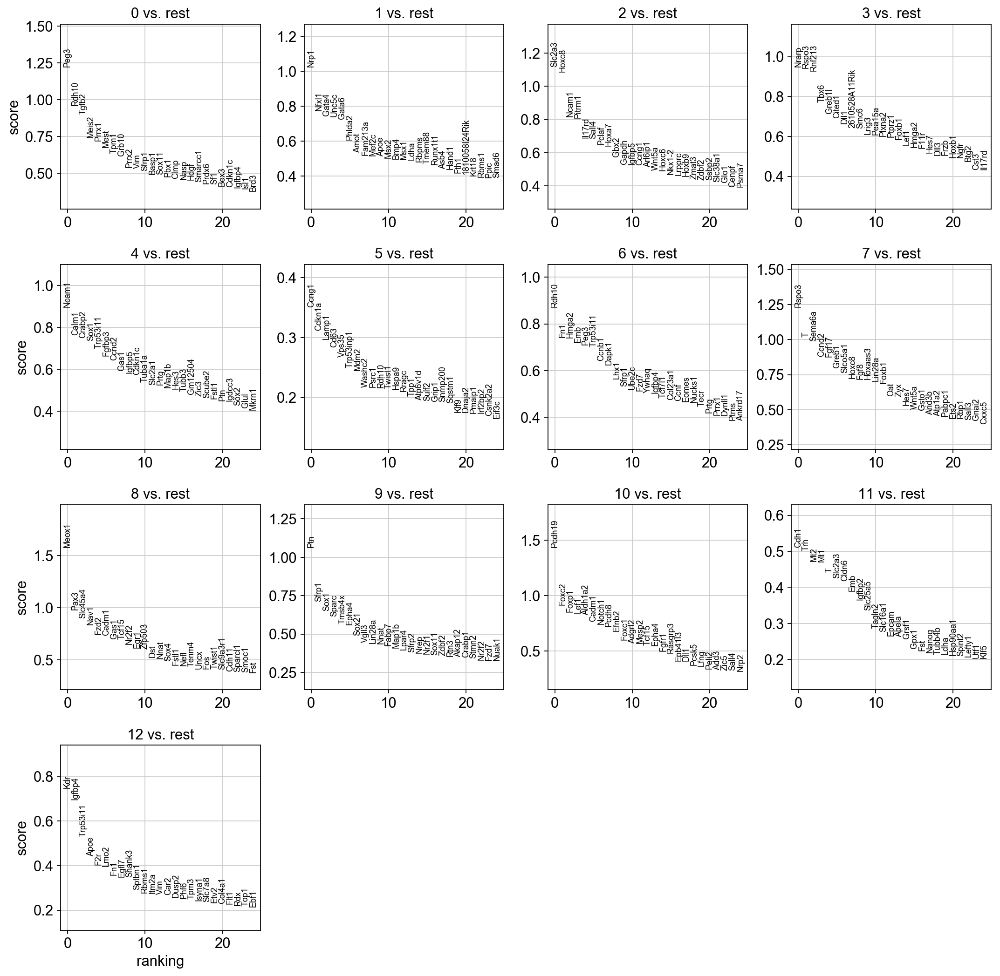

In [76]:
sc.tl.rank_genes_groups(adata, 'louvain', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Reload the object that has been save with the Wilcoxon Rank-Sum test result.

In [77]:
adata = sc.read(results_file)

Show the 10 top ranked genes per cluster 0, 1, ..., 7 in a dataframe.
Columns are louvain clusters.

In [78]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,Peg3,Nrp1,Hoxc8,Rspo3,Ncam1,Lamp1,Twist1,Sema6a,Meox1,Ptn,Pcdh19,Cdh1,Shank3
1,Rdh10,Gata6,Ncam1,Tbx6,Sox2,Mdm2,Top2a,T,Tcf15,Sox1,Lef1,Klf5,Kdr
2,Prrx1,Peg10,Slc2a3,Dll1,Sox1,Ccng1,Prrx2,Rspo3,Pax3,Sox21,Foxc2,Mt2,Tspan18
3,Prrx2,Runx1t1,Nkx1-2,Lef1,Ptn,Trp53inp1,Hmga2,Hoxc8,Cadm1,Tmsb4x,Notch1,Trh,Igfbp4
4,Meis2,Nfxl1,Hoxb9,Nrarp,Crabp2,Cdkn1a,Ccnb1,Hoxaas3,Nr2f2,Map1b,Foxp1,Mt1,Egfl7
5,Pbx1,Fn1,Sox2,Rnf213,Map1b,Sqstm1,Arl6ip1,Fgf17,Nav1,Fabp7,Foxc1,Nanog,Dusp2
6,Tgfb2,Unc5c,Gbx2,Dll3,Slc2a1,Perp,Peg3,Hes7,Foxc2,Prss23,Aldh1a2,Ephx2,Ramp2
7,Fzd2,Bmp4,Hoxaas3,Pcdh19,Dtx4,Stx3,Rdh10,Greb1,Gas1,Sparc,Efnb2,Gpx1,Flt1
8,Twist1,Hand2,Hoxc6,Pea15a,Mkrn1,Klf9,Nusap1,Foxb1,Foxd1,Fzd3,Epb41l3,Slc2a3,Ets1
9,Cd24a,Vim,Slc2a1,Hes7,Psd3,Tpp1,Prrx1,Pabpc1,Fbn2,Epha4,Cadm1,Epcam,Car2


Get a table with the scores and groups.

In [79]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,8_n,8_p,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p
0,Peg3,5.268627e-149,Nrp1,3.016741e-190,Hoxc8,9.302438e-118,Rspo3,2.164277e-127,Ncam1,2.046164e-104,...,Meox1,2.684659e-105,Ptn,4.475670e-87,Pcdh19,5.252139e-85,Cdh1,1.118626e-43,Shank3,9.604015e-22
1,Rdh10,5.755561e-137,Gata6,8.199139e-172,Ncam1,1.040155e-115,Tbx6,1.481414e-124,Sox2,2.352044e-101,...,Tcf15,1.219171e-85,Sox1,1.626022e-81,Lef1,1.465270e-73,Klf5,2.032725e-37,Kdr,3.449826e-21
2,Prrx1,1.566805e-96,Peg10,9.274014e-151,Slc2a3,1.139037e-107,Dll1,1.453834e-118,Sox1,1.516910e-96,...,Pax3,3.887554e-78,Sox21,8.301521e-72,Foxc2,2.251615e-70,Mt2,2.369082e-37,Tspan18,8.288127e-19
3,Prrx2,3.694917e-95,Runx1t1,9.587382e-141,Nkx1-2,4.810820e-91,Lef1,3.593645e-114,Ptn,8.639830e-92,...,Cadm1,2.567009e-77,Tmsb4x,2.894474e-63,Notch1,3.414759e-70,Trh,6.190347e-36,Igfbp4,8.781465e-19
4,Meis2,3.252935e-92,Nfxl1,3.847394e-137,Hoxb9,3.020657e-89,Nrarp,5.868335e-103,Crabp2,2.990789e-91,...,Nr2f2,1.534242e-69,Map1b,5.105589e-61,Foxp1,2.608983e-65,Mt1,6.498431e-36,Egfl7,8.909265e-19


In [80]:
rank_genes_groups = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})

rank_genes_groups.head()

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,8_n,8_p,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p
0,Peg3,5.268627e-149,Nrp1,3.016741e-190,Hoxc8,9.302438e-118,Rspo3,2.164277e-127,Ncam1,2.046164e-104,...,Meox1,2.684659e-105,Ptn,4.475670e-87,Pcdh19,5.252139e-85,Cdh1,1.118626e-43,Shank3,9.604015e-22
1,Rdh10,5.755561e-137,Gata6,8.199139e-172,Ncam1,1.040155e-115,Tbx6,1.481414e-124,Sox2,2.352044e-101,...,Tcf15,1.219171e-85,Sox1,1.626022e-81,Lef1,1.465270e-73,Klf5,2.032725e-37,Kdr,3.449826e-21
2,Prrx1,1.566805e-96,Peg10,9.274014e-151,Slc2a3,1.139037e-107,Dll1,1.453834e-118,Sox1,1.516910e-96,...,Pax3,3.887554e-78,Sox21,8.301521e-72,Foxc2,2.251615e-70,Mt2,2.369082e-37,Tspan18,8.288127e-19
3,Prrx2,3.694917e-95,Runx1t1,9.587382e-141,Nkx1-2,4.810820e-91,Lef1,3.593645e-114,Ptn,8.639830e-92,...,Cadm1,2.567009e-77,Tmsb4x,2.894474e-63,Notch1,3.414759e-70,Trh,6.190347e-36,Igfbp4,8.781465e-19
4,Meis2,3.252935e-92,Nfxl1,3.847394e-137,Hoxb9,3.020657e-89,Nrarp,5.868335e-103,Crabp2,2.990789e-91,...,Nr2f2,1.534242e-69,Map1b,5.105589e-61,Foxp1,2.608983e-65,Mt1,6.498431e-36,Egfl7,8.909265e-19


In [81]:
rank_genes_groups.to_csv(pathToData + 'rank_genes_groups_louvainclusters.csv')

Compare to a single cluster. 

ranking genes
    finished (0:00:01.13)


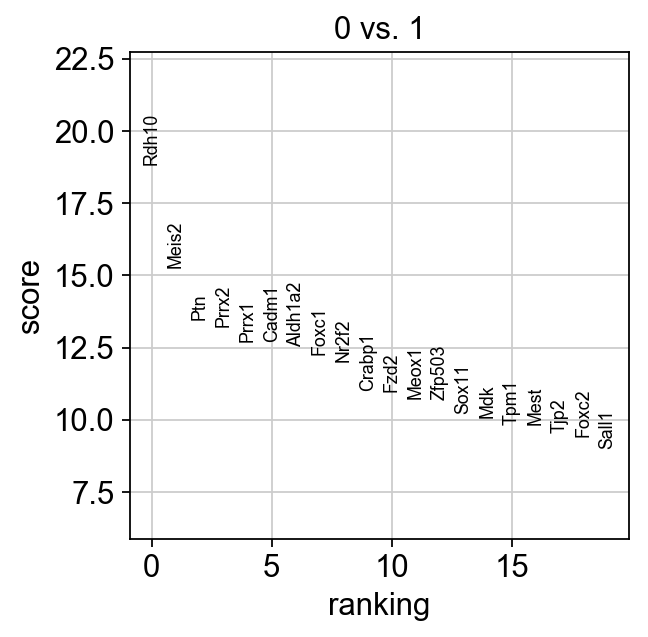

In [82]:
sc.tl.rank_genes_groups(adata, 'louvain', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

### Define marker genes per cluster, based on the table above



Overview of louvain clusters, cell type annotation, known marker genes and marker genes as defined by Scanpy.

Louvain Group | Cell type | Known marker genes | Scanpy marker genes
---|---|---|---
0 | Early endoderm (?) | Prdm1, Irx1 | Peg3, Prrx1, Prrx2, Pbx1, Meis2
1 | Neurons | Sox1, Sox2 | Sox1, Sox2, Sox13, Ncam1, Crabp2
2 | Early heart progenitors | Bmp4, Gata4, Gata6, Hand1, Hand2 | Bmp4, Runx1t1, Gata6, Msx1, Nrp1, Peg10
3 | Allantois (?) | Tbx4 | Mdm2, Klf9, Stx3, Cdkn1a, Ccng1
4 | Presomitic mesoderm | Dll1, Hes7, Snai1, Hes5, Dkk1, Lfng | Dll1, Hes7, Rspo3, Dll3, Tbx6
5 | Early somitic | Eya1, Pax3, Six1, Cer1 | Eya1, Pax3, Meox1, Cadm1, Nav1
6 | ` | Sox1, Sox2 | Sox2, Nkx1-2, Gbx2, Hoxc8, Hoxb9, Hoxc9
7 | Early endoderm (?) | Prdm1, Irx1 | Prrx1, Ube2c, Ccnb1, Plk1, Cenpf
8 | Tailbud | T, Wnt3a, Cdx2, Fgf8 | T, Foxb1, Fgf17, Rspo3, Hoxc6, Hoxc8, Hes7
9 | Anterior neural / Neurectoderm | Foxg1 | Sox1, Sox21, Tmsb4x, Epha4
10 | Somitogenesis wavefront | Aldh1a2, Notch1, Lfng | Aldh1a2, Notch1, Foxc1, Foxc2, Foxp1, Lef1
11a | PGCs | Sox2, Nanog | Nanog, Mt1, Mt2
11b | Node | Cdh1, Trh, Nodal, Sox17, Epcam | Cdh1, Trh
12 | Haemogenic | Sox7 | Car2, Kdr
13 | Branchial arches | Onecut2, Elavl3, Tmsb4x, Celsr3, Btbd17 | Onecut2, Elavl3, Tmsb4x, Hes6

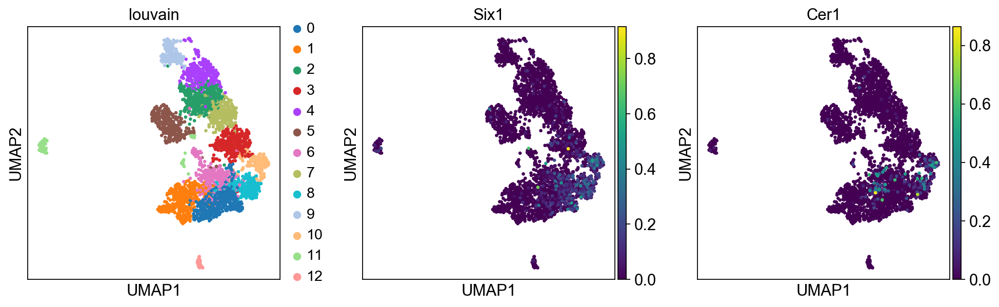

In [95]:
sc.pl.umap(adata, color=['louvain', 'Six1', 'Cer1'], use_raw=True)

### Hox genes

In [110]:
adata.var.filter(regex=r'Hox', axis=0).index

Index(['Hoxc8', 'Hoxc6', 'Hoxb1', 'Hoxb9', 'Hoxd8', 'Hoxc9', 'Hoxa9', 'Hoxa7',
       'Hoxb4', 'Hoxd9', 'Hoxb3', 'Hoxb8', 'Hoxa3', 'Hoxb5os', 'Hoxaas3'],
      dtype='object', name='index')

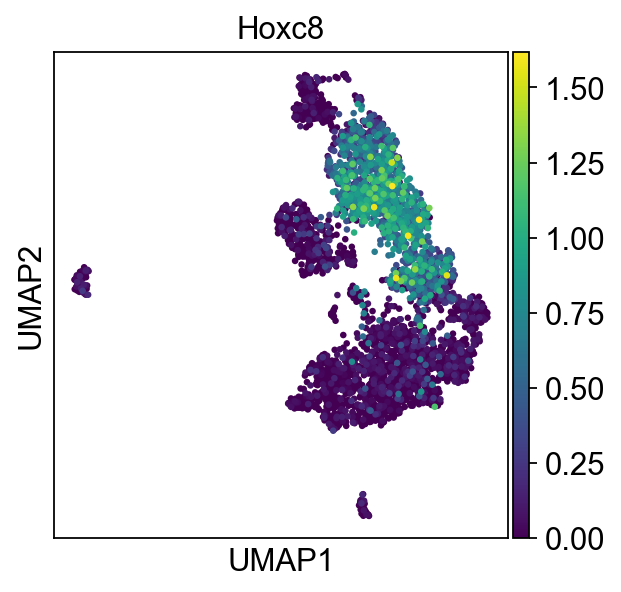

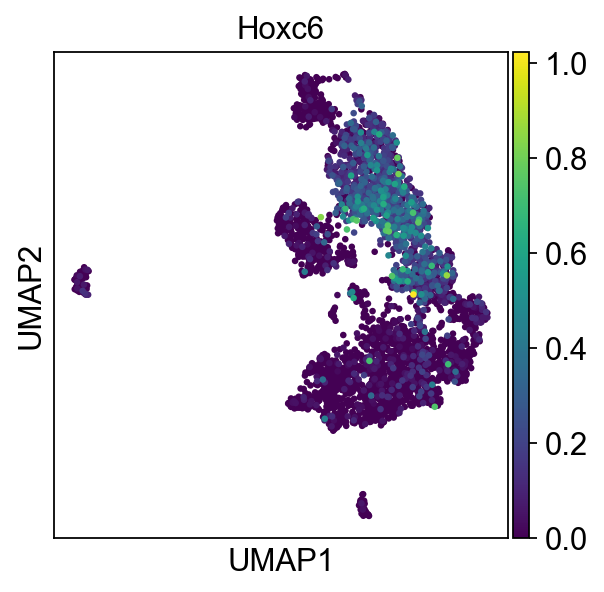

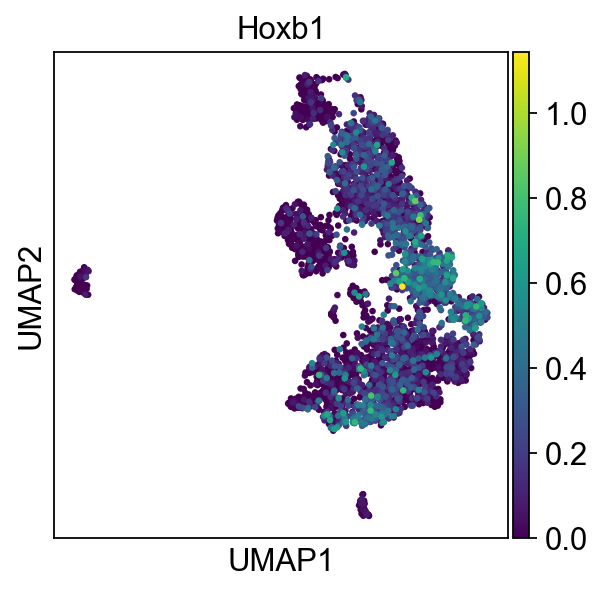

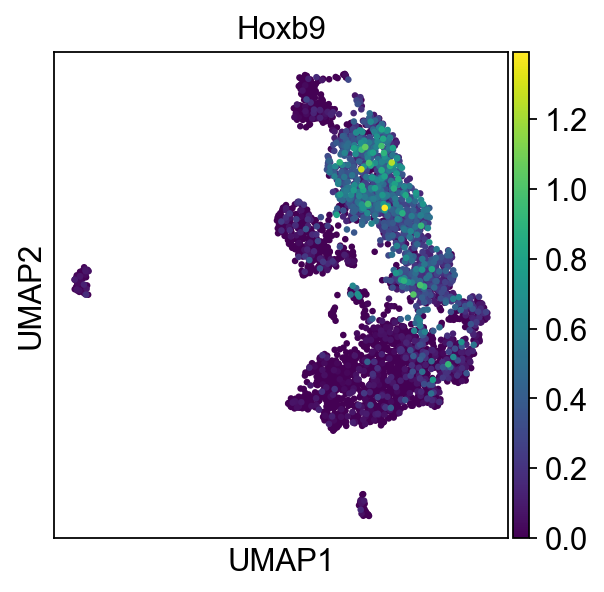

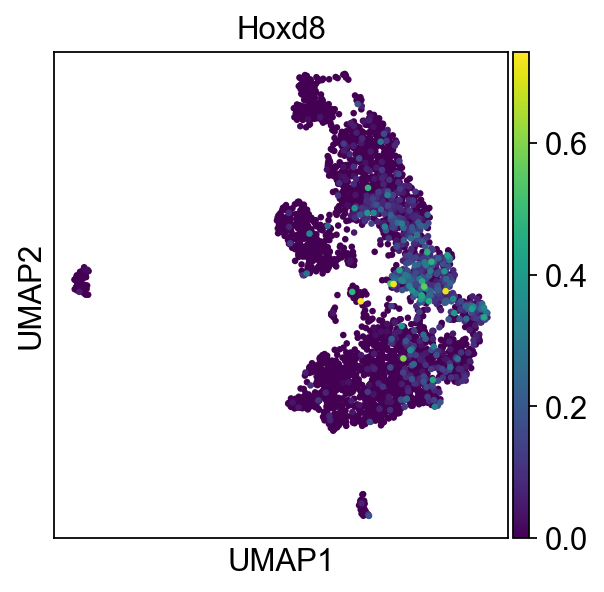

...

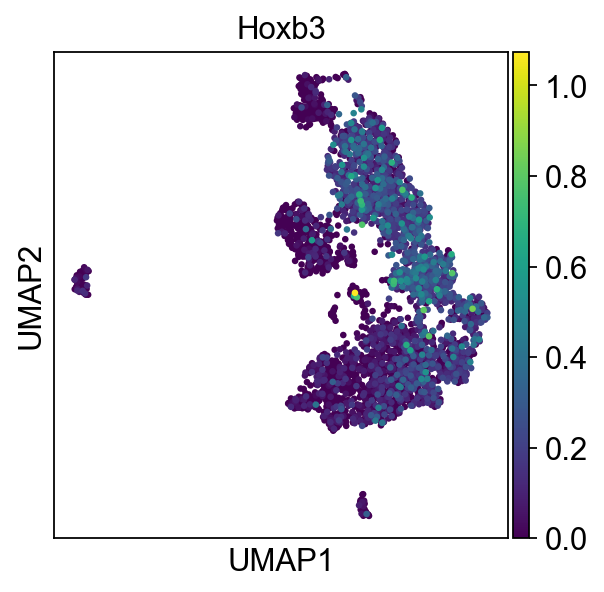

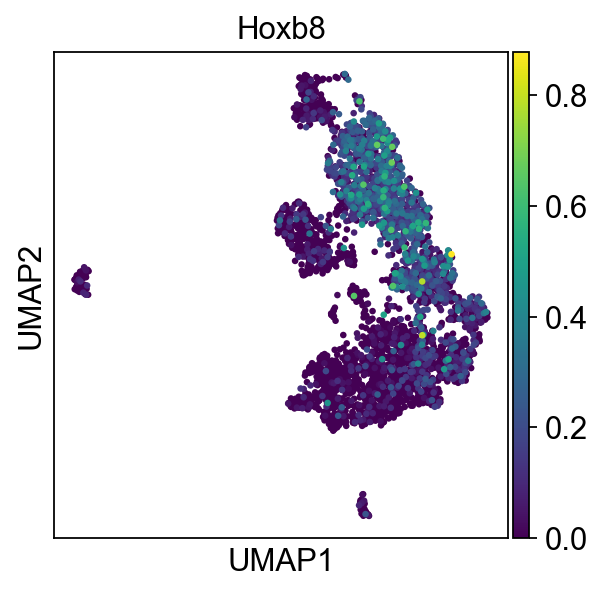

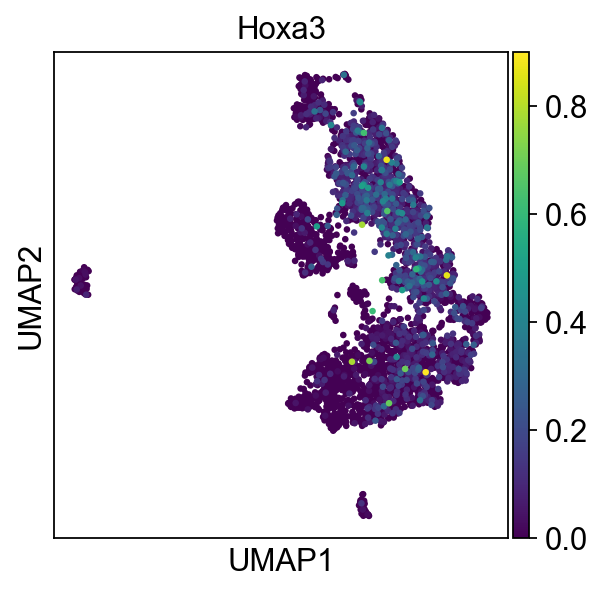

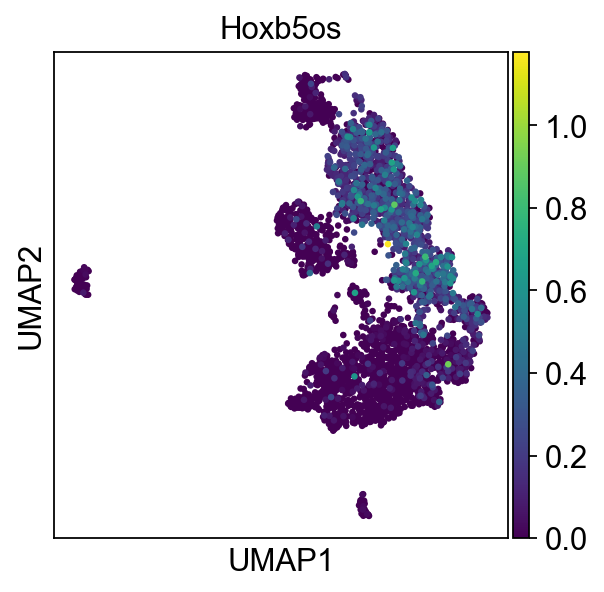

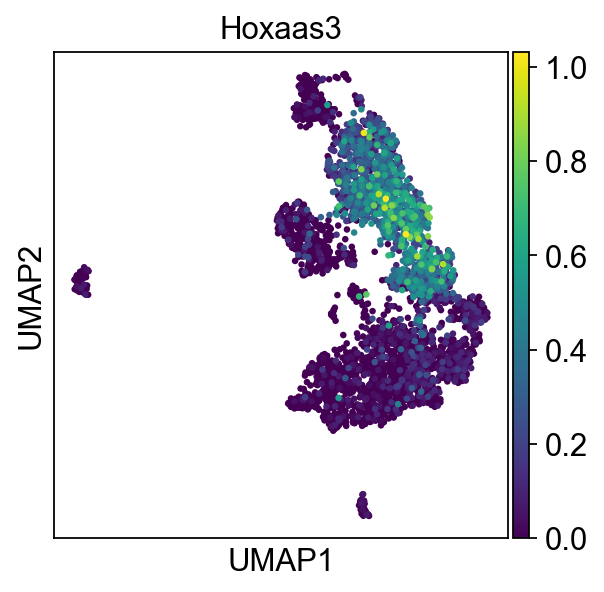

In [111]:
for gene in adata.var.filter(regex=r'Hox', axis=0).index:
    sc.pl.umap(adata, color=gene, use_raw = True)

# Cell type classification based on marker genes

In [149]:
adataNewNames = adata.copy()
new_cluster_names = ['Early endoderm', 'Neurons', 'Early heart progenitors', 'Presomitic mesoderm', 'Allantois (?)',
                     'Early endoderm (?)', 'Tailbud', 'Neurons2', 'Early somitic', 
                     'Anterior neural / Neurectoderm + branchial arches', 'Somitogenesis wavefront', 'PGCs', 'GM genes',
                     'Haemogenic', 'Node pit']

adataNewNames.rename_categories('louvain', new_cluster_names)
numbers = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14']
adata.rename_categories('louvain', numbers)

Omitting rank_genes_groups/logfoldchanges as old categories do not match.
Omitting rank_genes_groups/names as old categories do not match.
Omitting rank_genes_groups/pvals as old categories do not match.
Omitting rank_genes_groups/pvals_adj as old categories do not match.
Omitting rank_genes_groups/scores as old categories do not match.


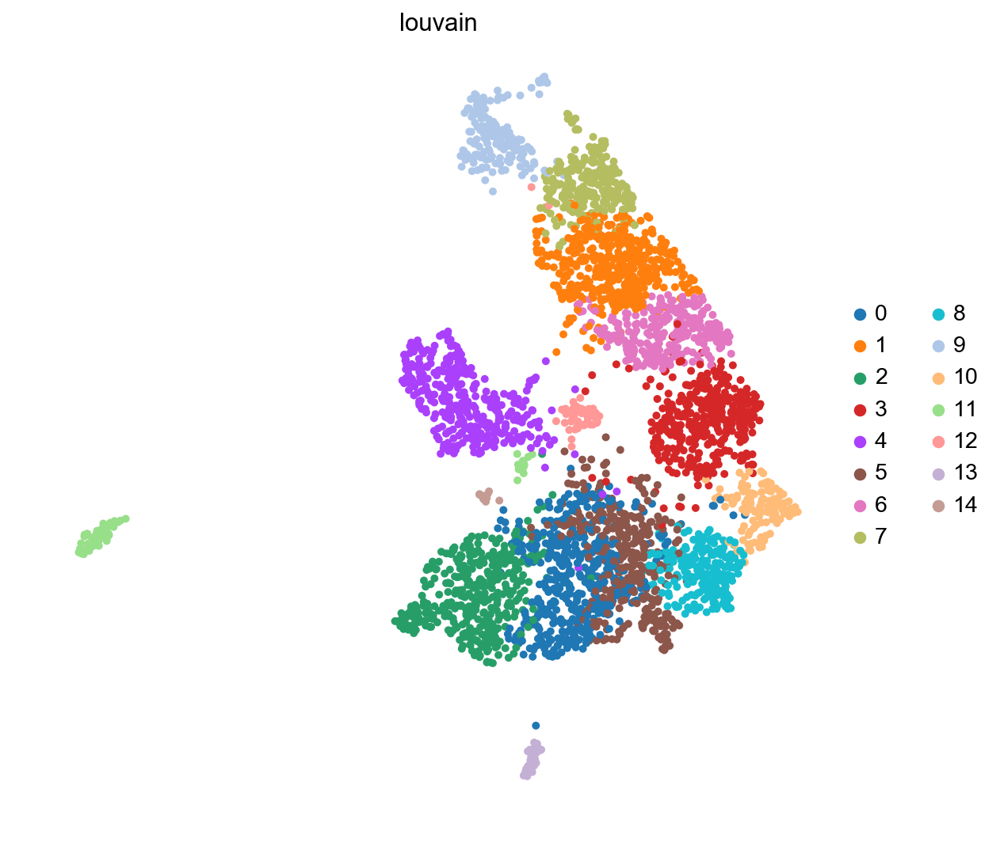

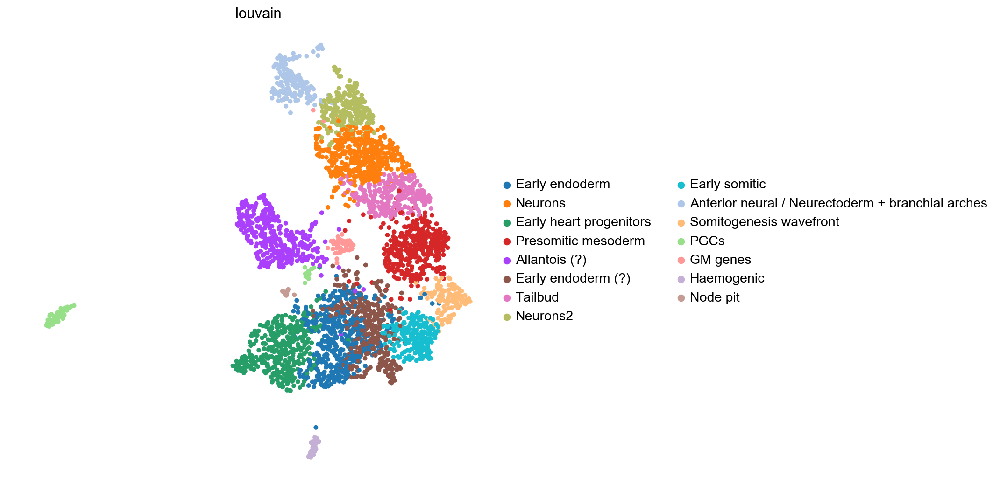

In [150]:
fig,ax = plt.subplots(figsize=(8,8))
ax = sc.pl.umap(adata, color = 'louvain', ax=ax, frameon=False,size = 80)
fig,ax = plt.subplots(figsize=(8,8))
ax = sc.pl.umap(adataNewNames, color = 'louvain', ax=ax, frameon=False,size = 80)

In [291]:
adata = sc.read(results_file)

saving figure to file ./figures/umapTbx1.pdf


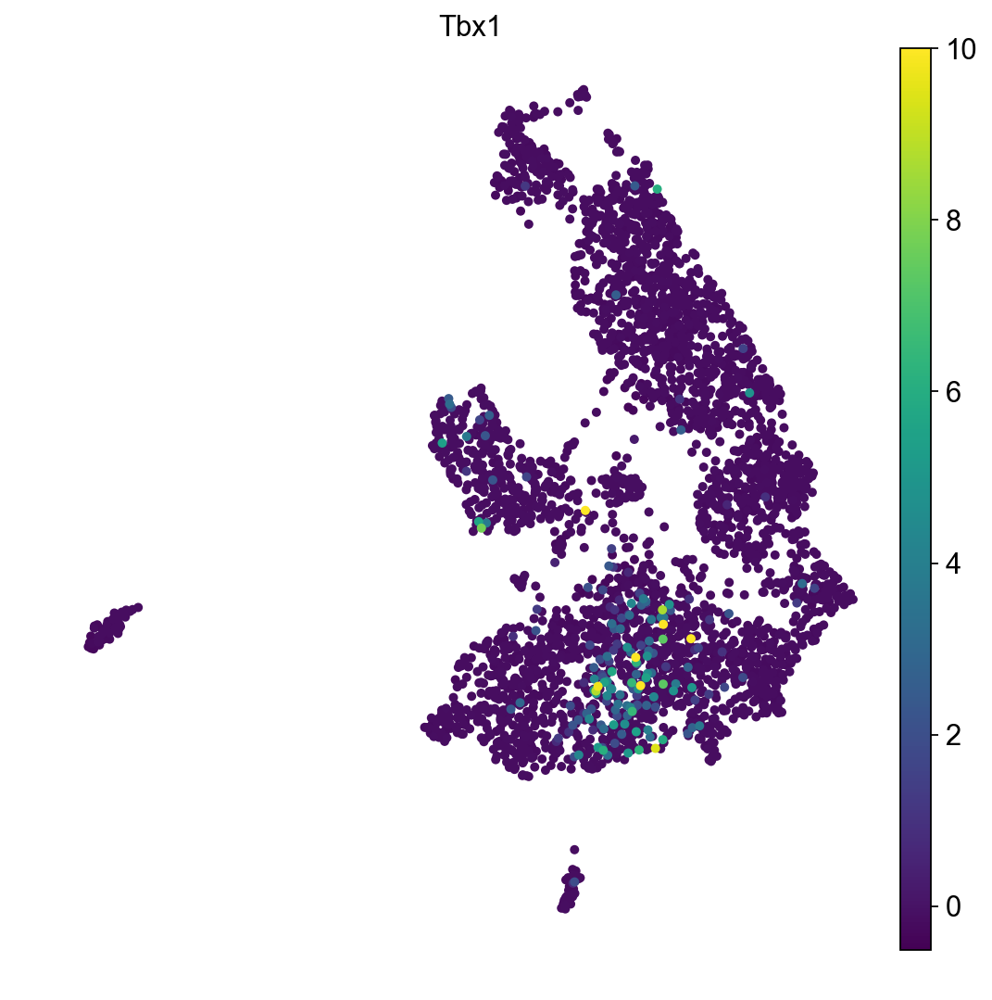

saving figure to file ./figures/umapPrdm1.pdf


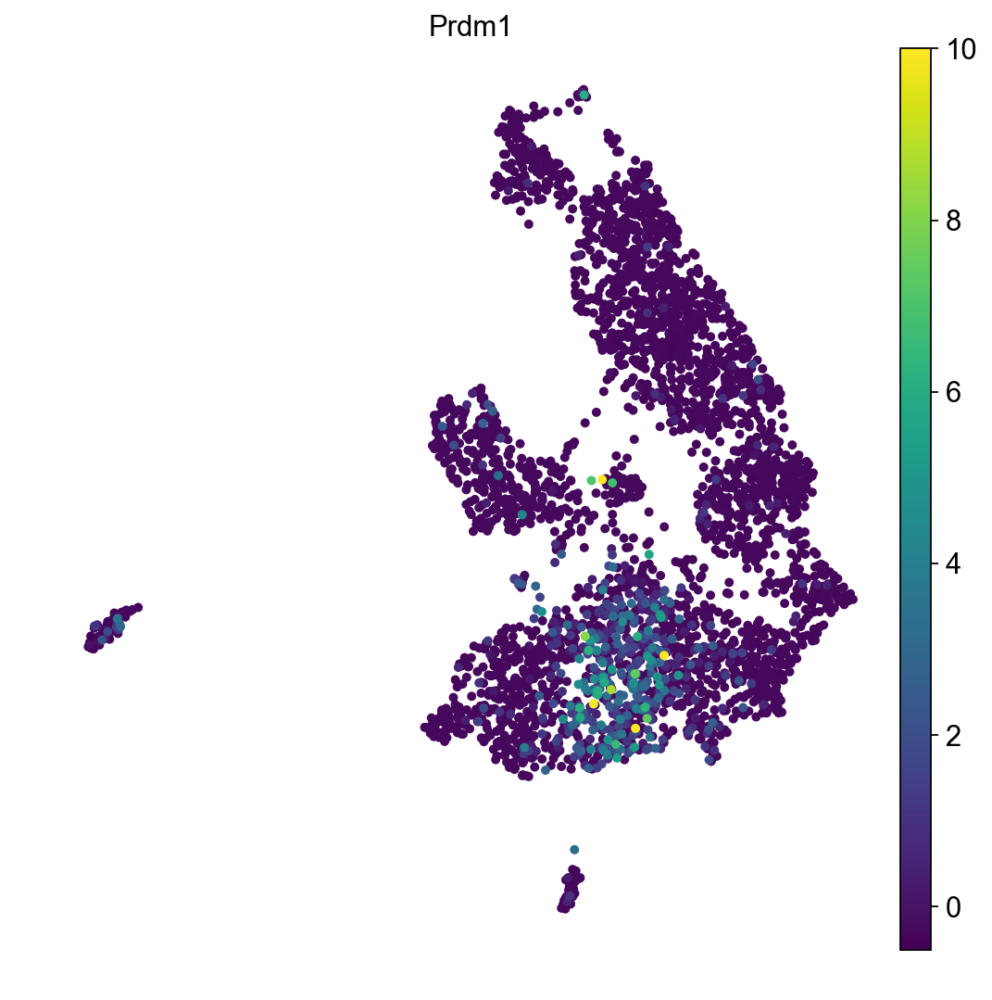

saving figure to file ./figures/umapIrx1.pdf


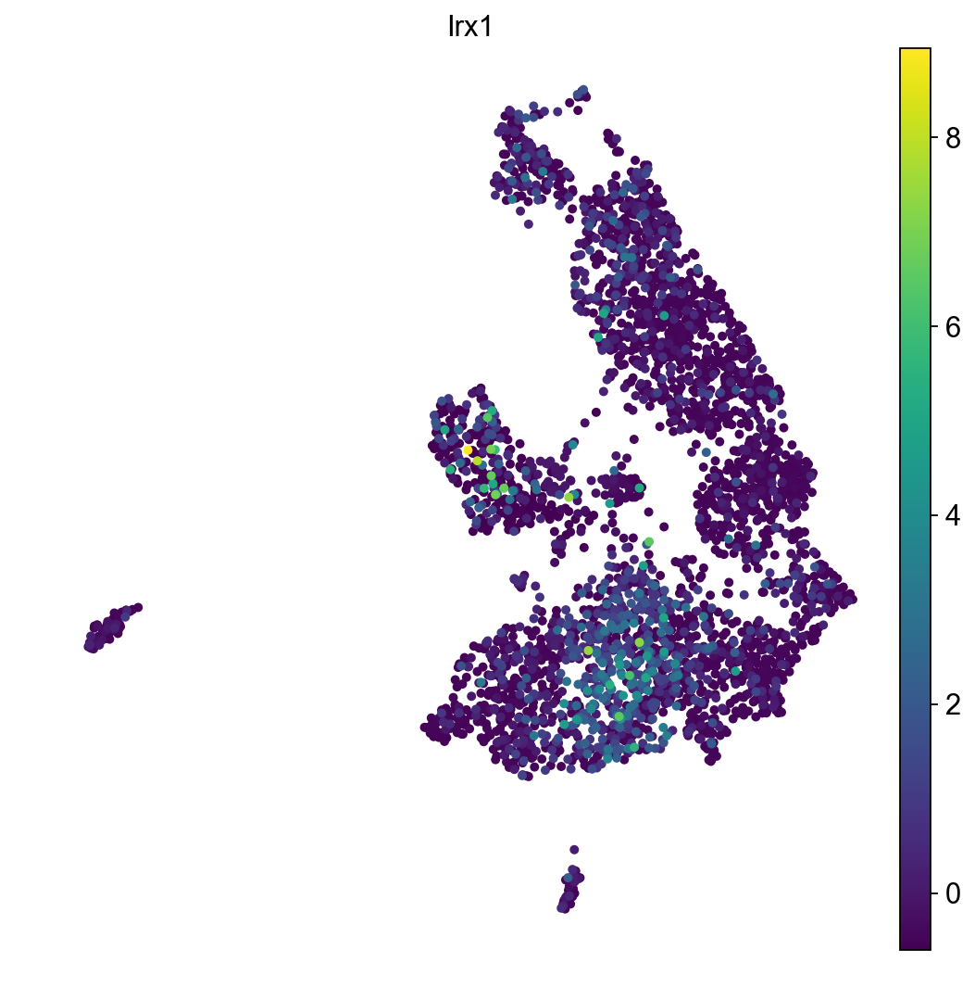

In [303]:

genes = ['Tbx1','Prdm1','Irx1']

for gene in genes:
    fig,ax = plt.subplots(figsize=(8,8))
    sc.pl.umap(adata, color=gene, use_raw = False,ax=ax,size = 80,frameon=False,save=gene)
    


saving figure to file ./figures/umapKdr.pdf


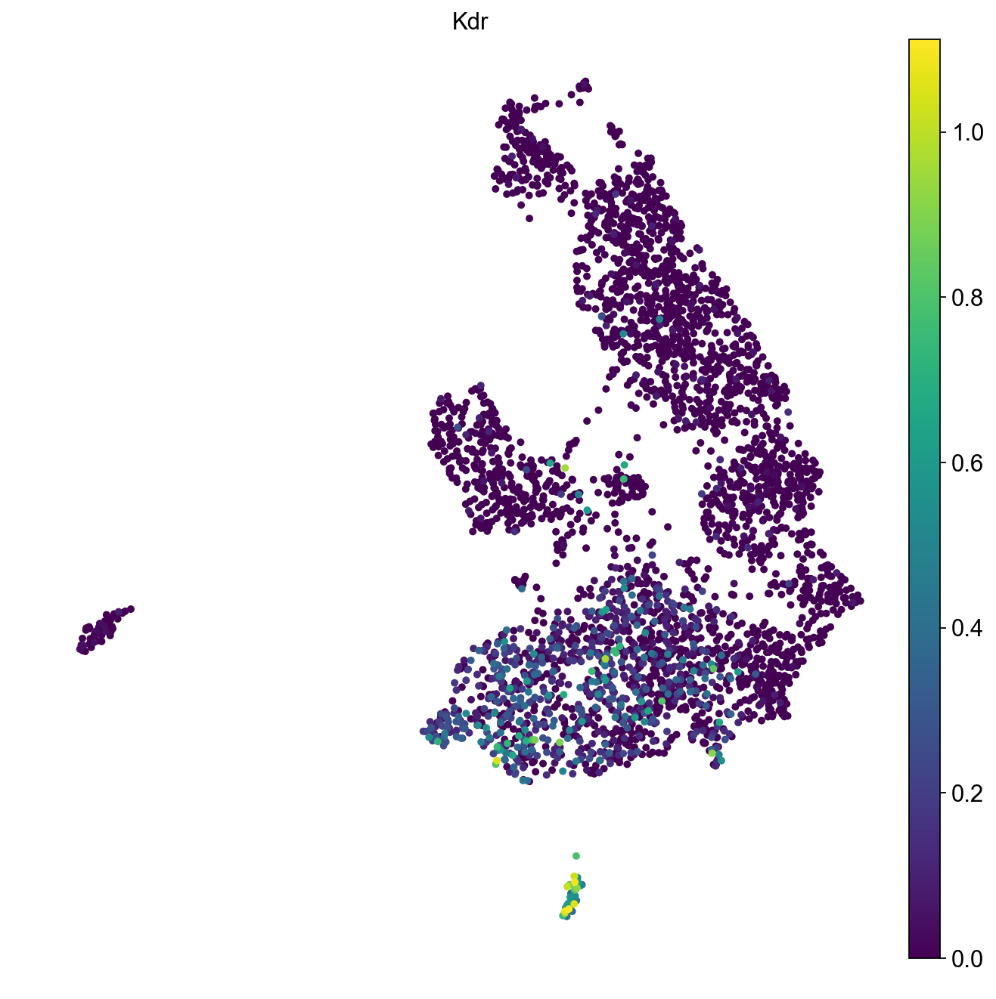

saving figure to file ./figures/umapNotch1.pdf


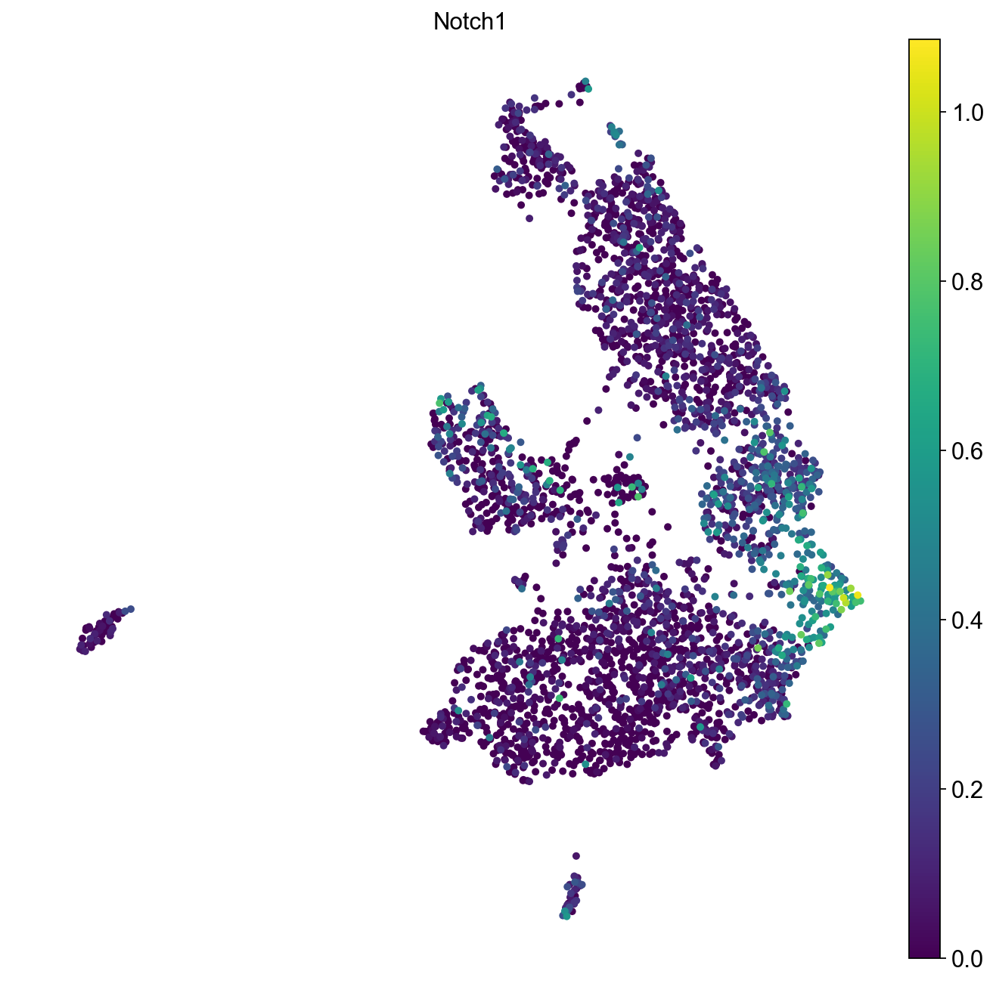

saving figure to file ./figures/umapOnecut2.pdf


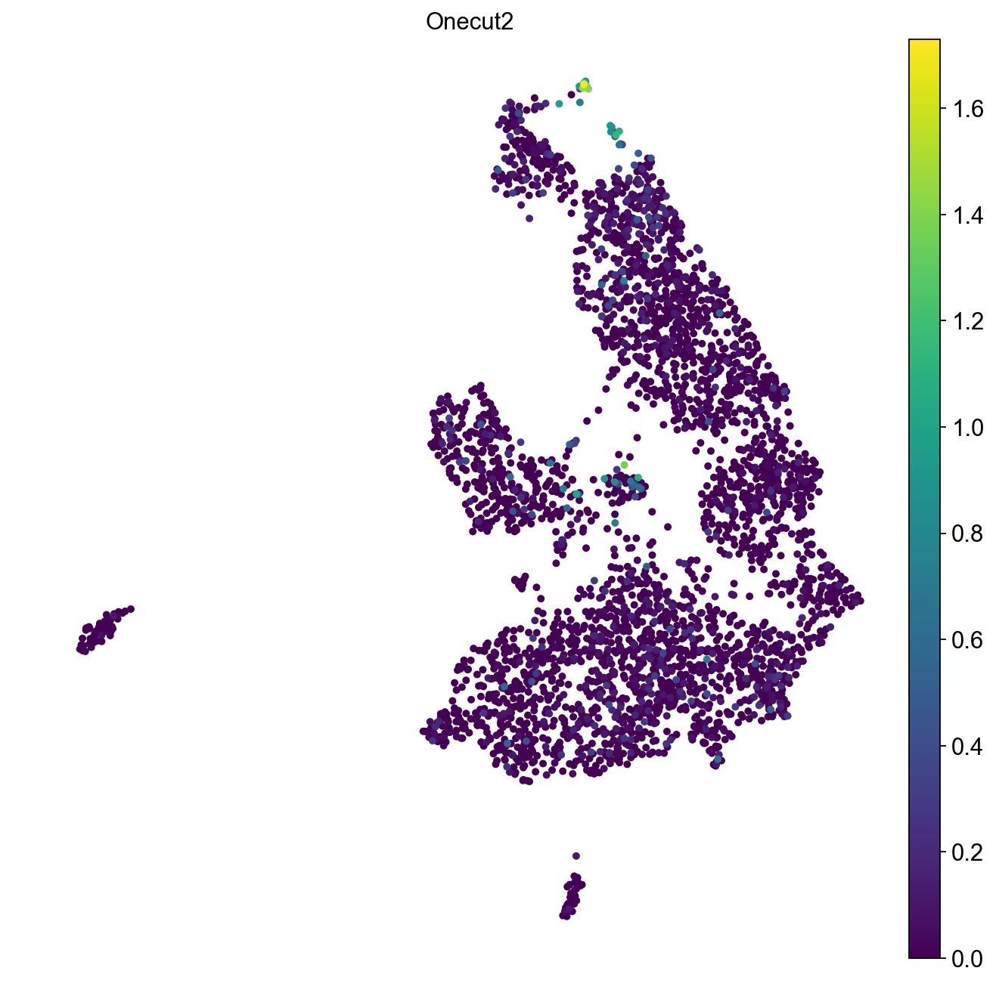

saving figure to file ./figures/umapCdx1.pdf


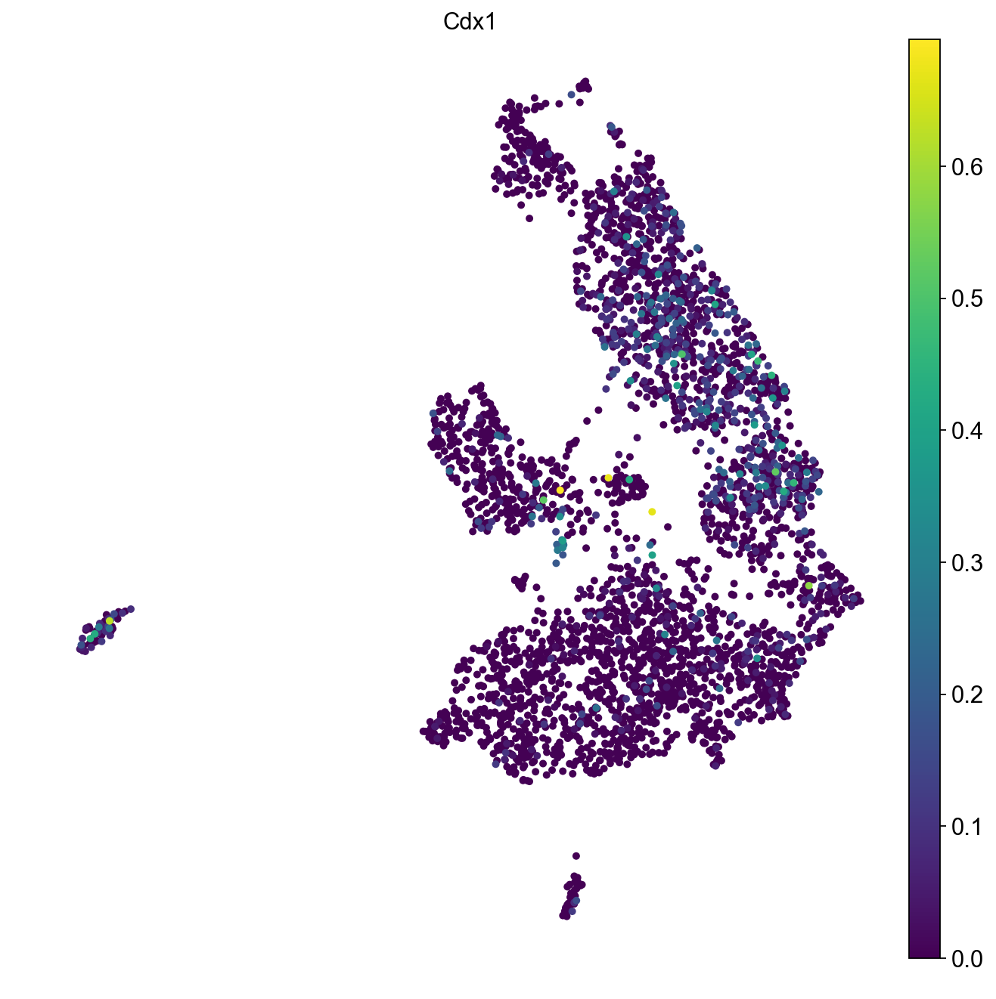

saving figure to file ./figures/umapT.pdf


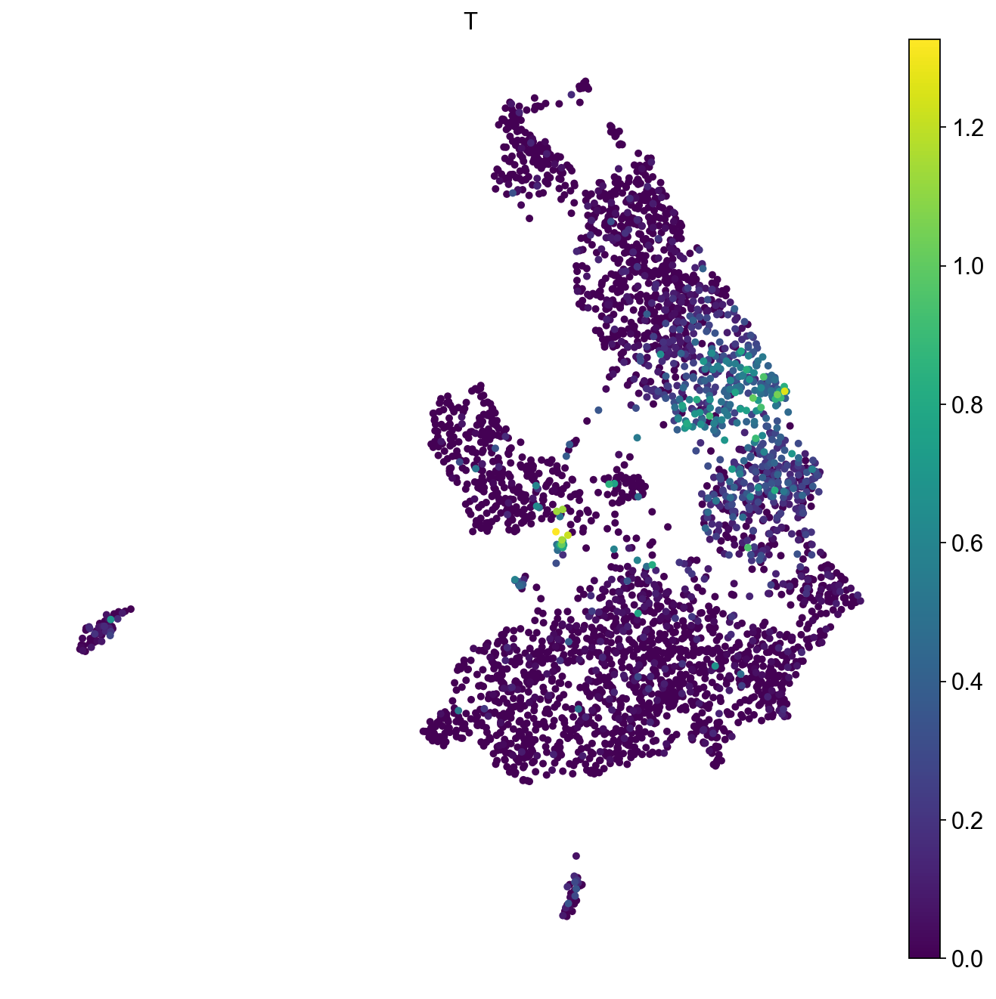

saving figure to file ./figures/umapGata6.pdf


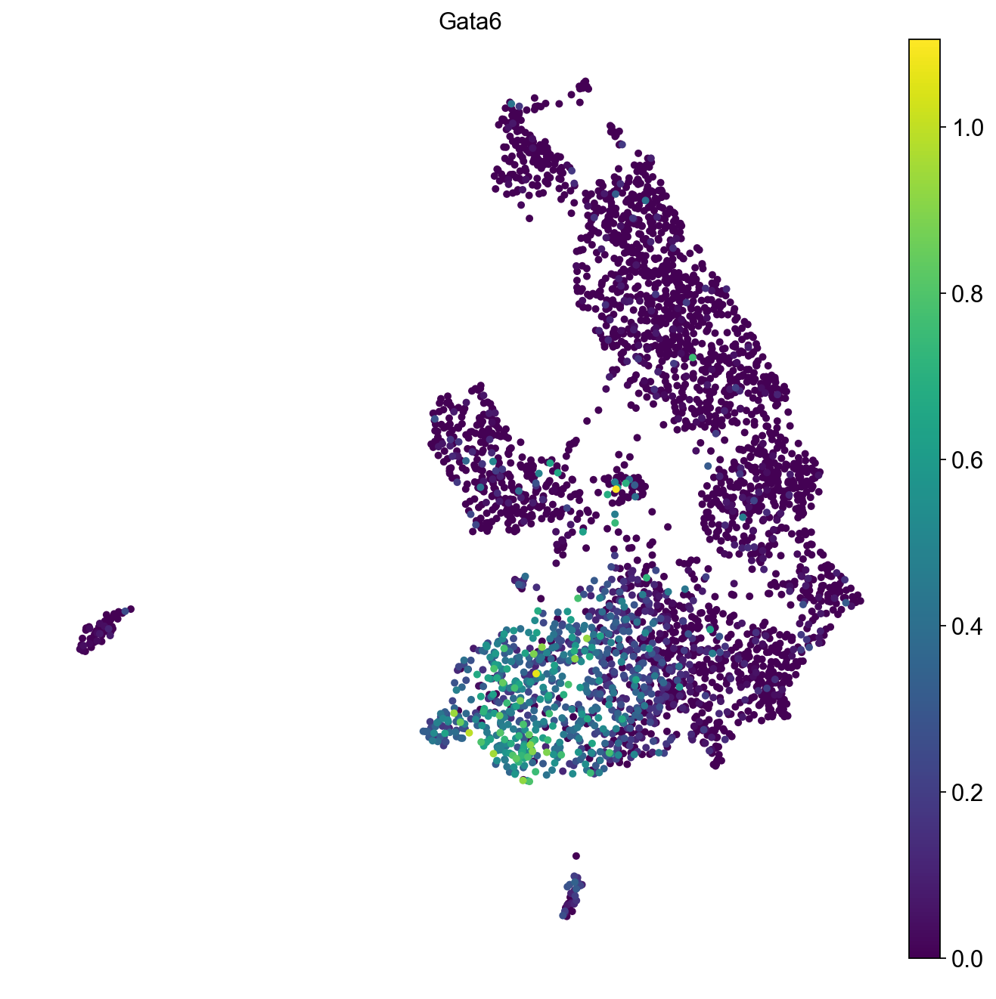

saving figure to file ./figures/umapHand1.pdf


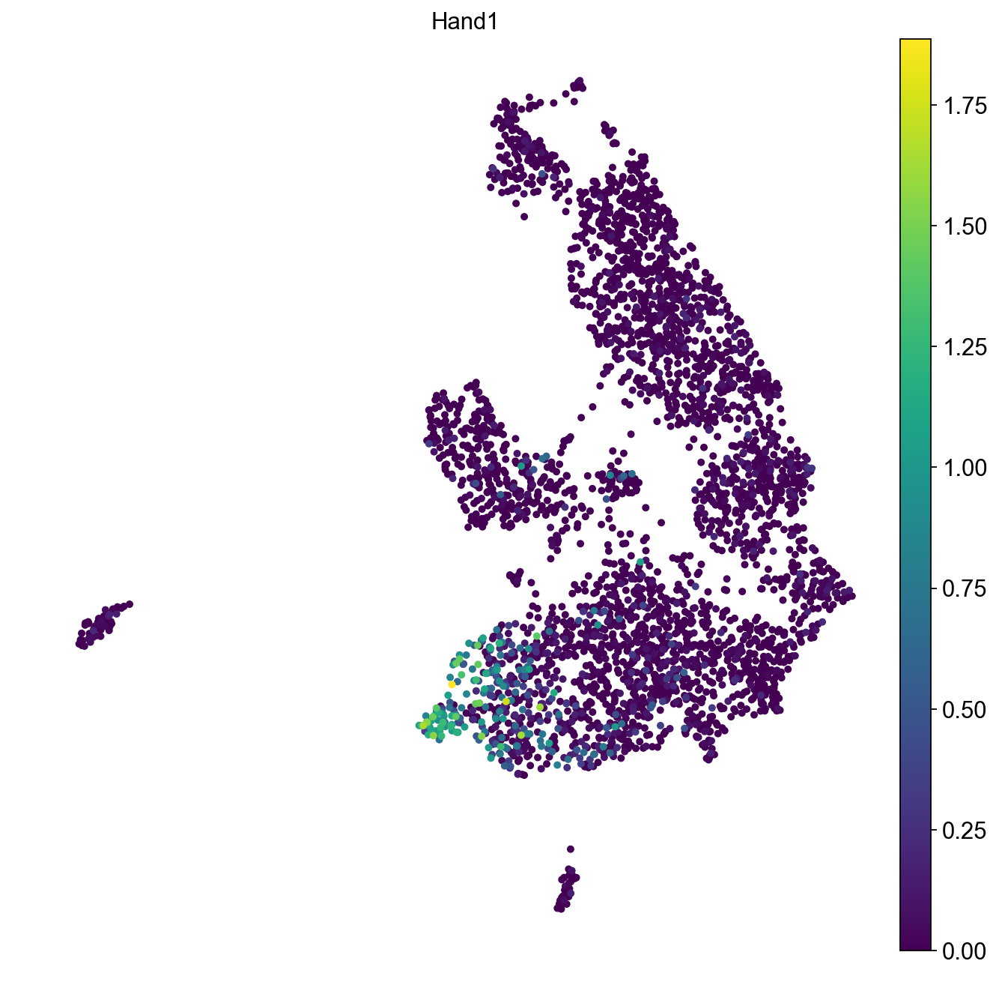

saving figure to file ./figures/umapHand2.pdf


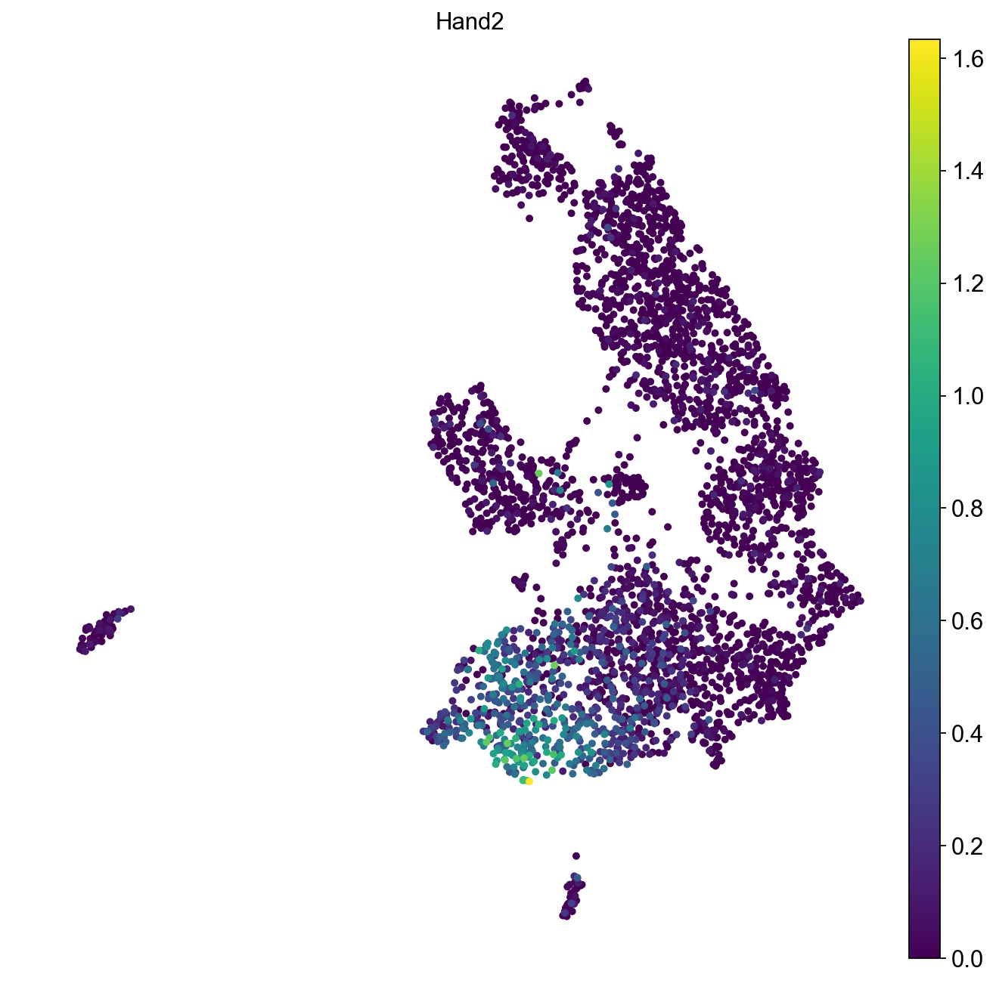

saving figure to file ./figures/umapSox1.pdf


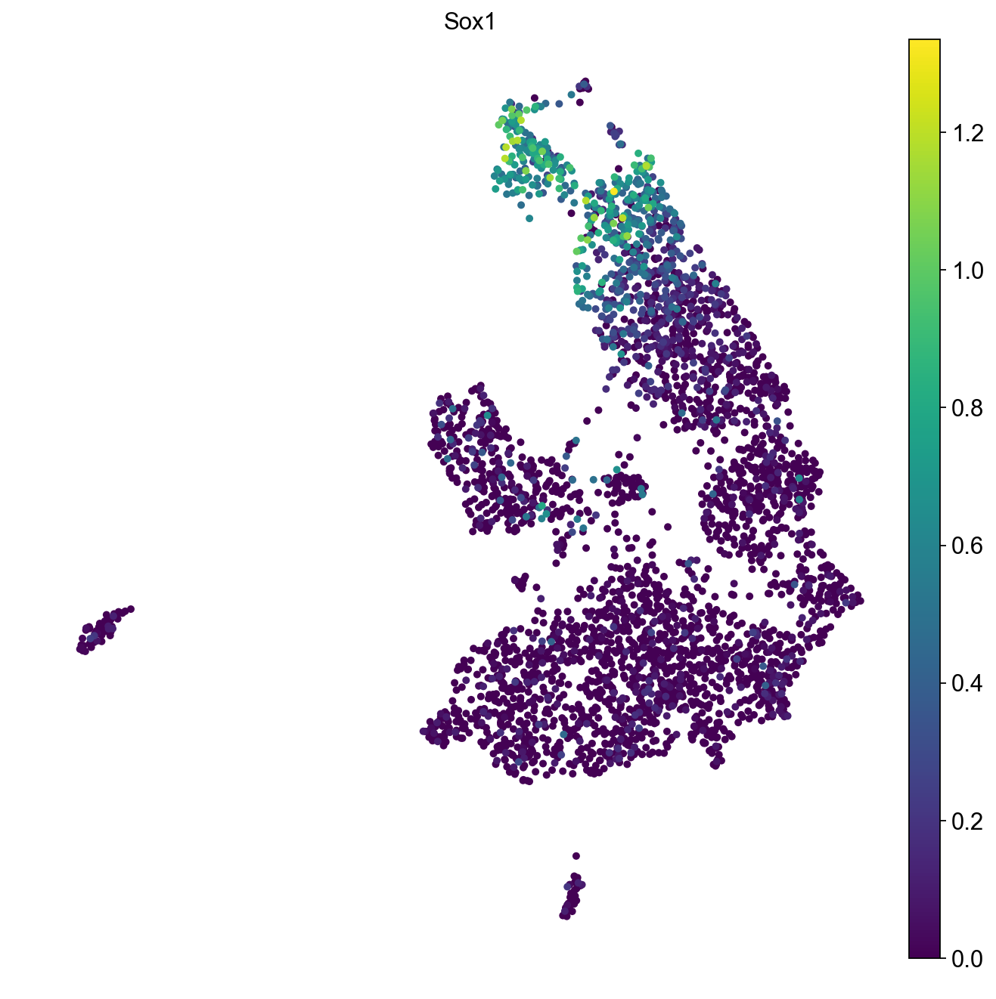

saving figure to file ./figures/umapSox2.pdf


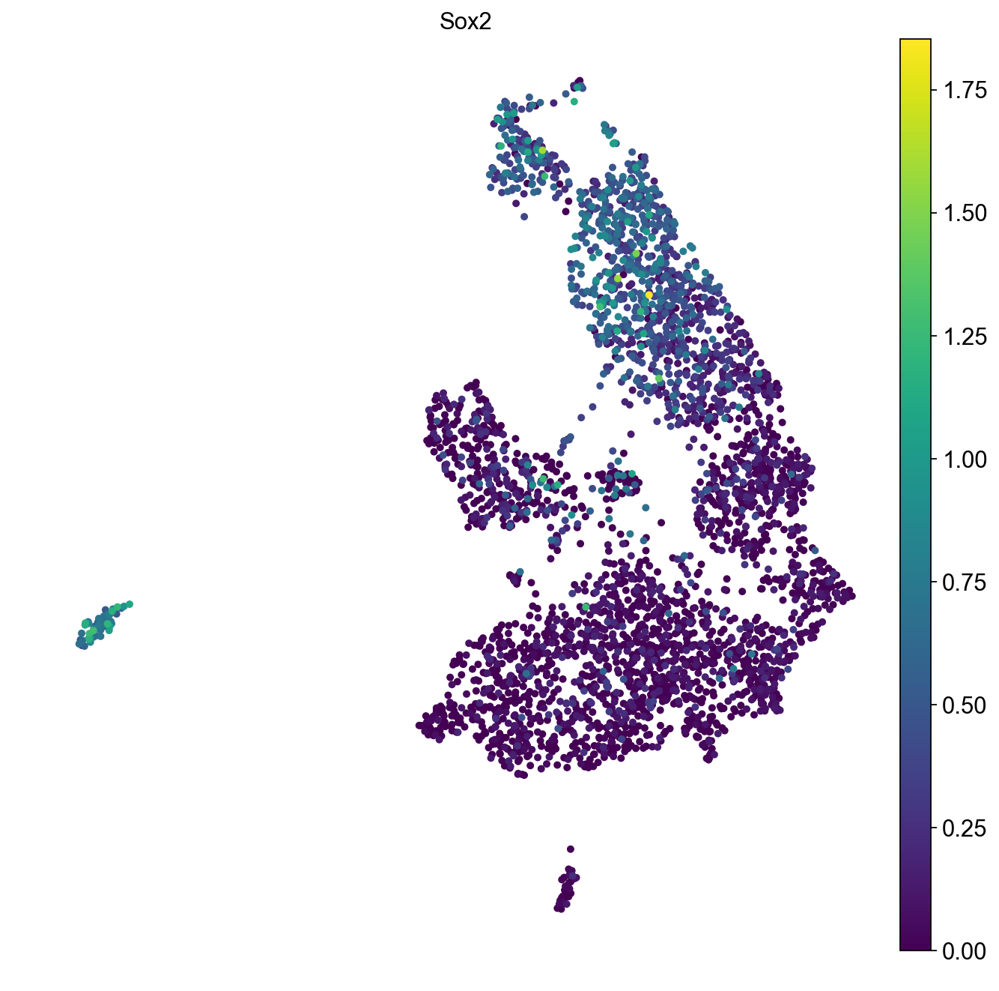

saving figure to file ./figures/umapCdh1.pdf


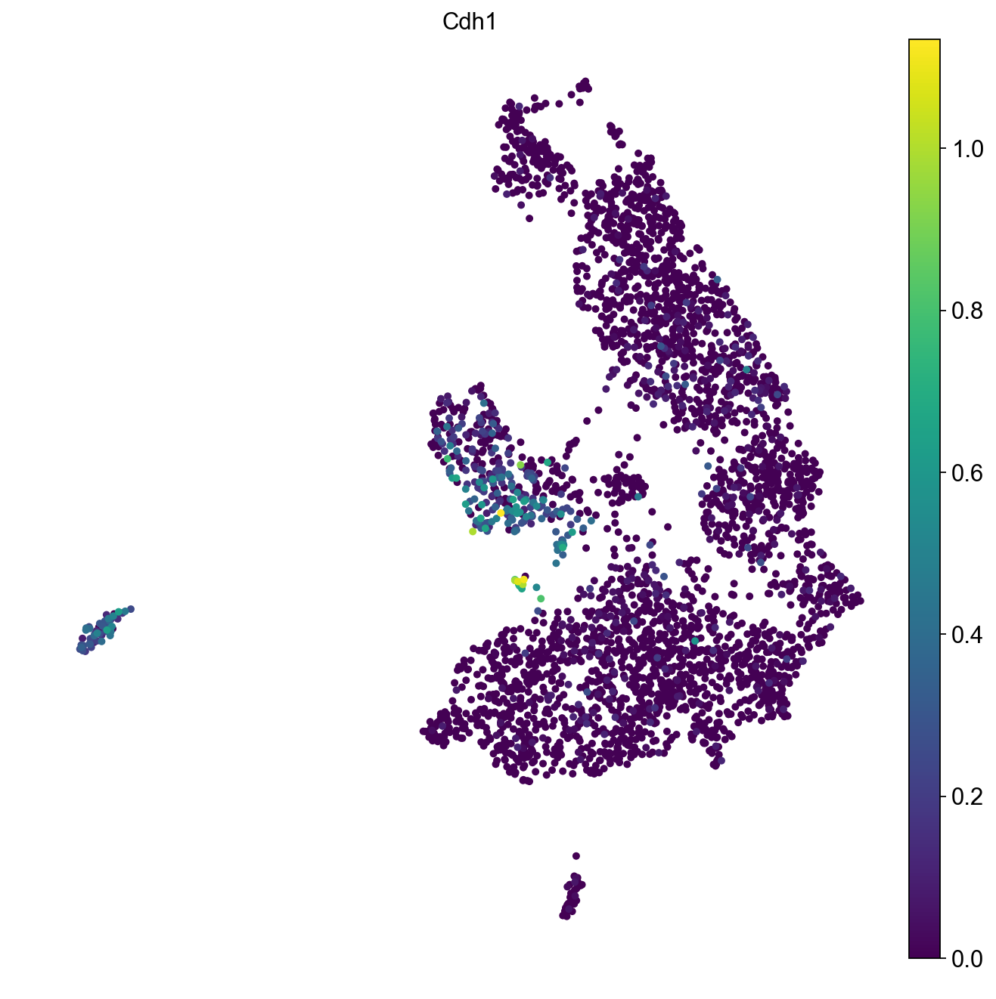

saving figure to file ./figures/umapEpcam.pdf


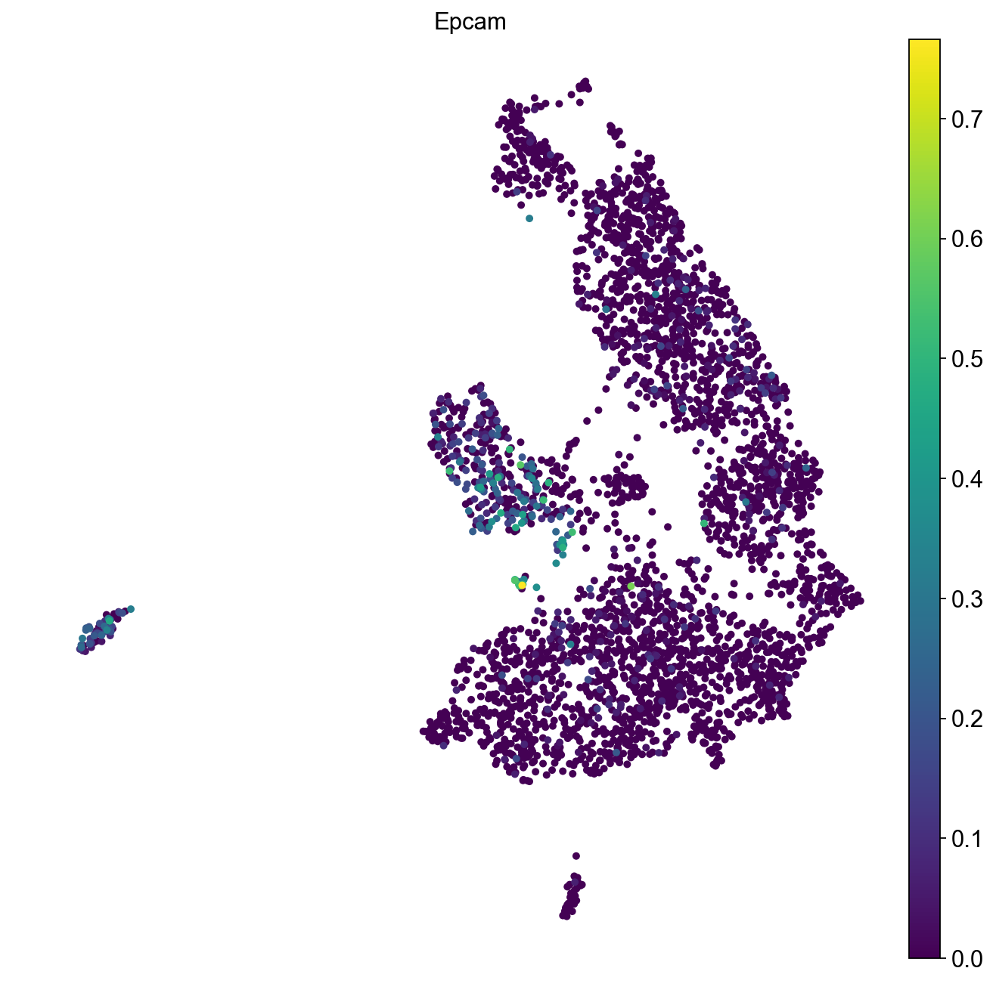

saving figure to file ./figures/umapNodal.pdf


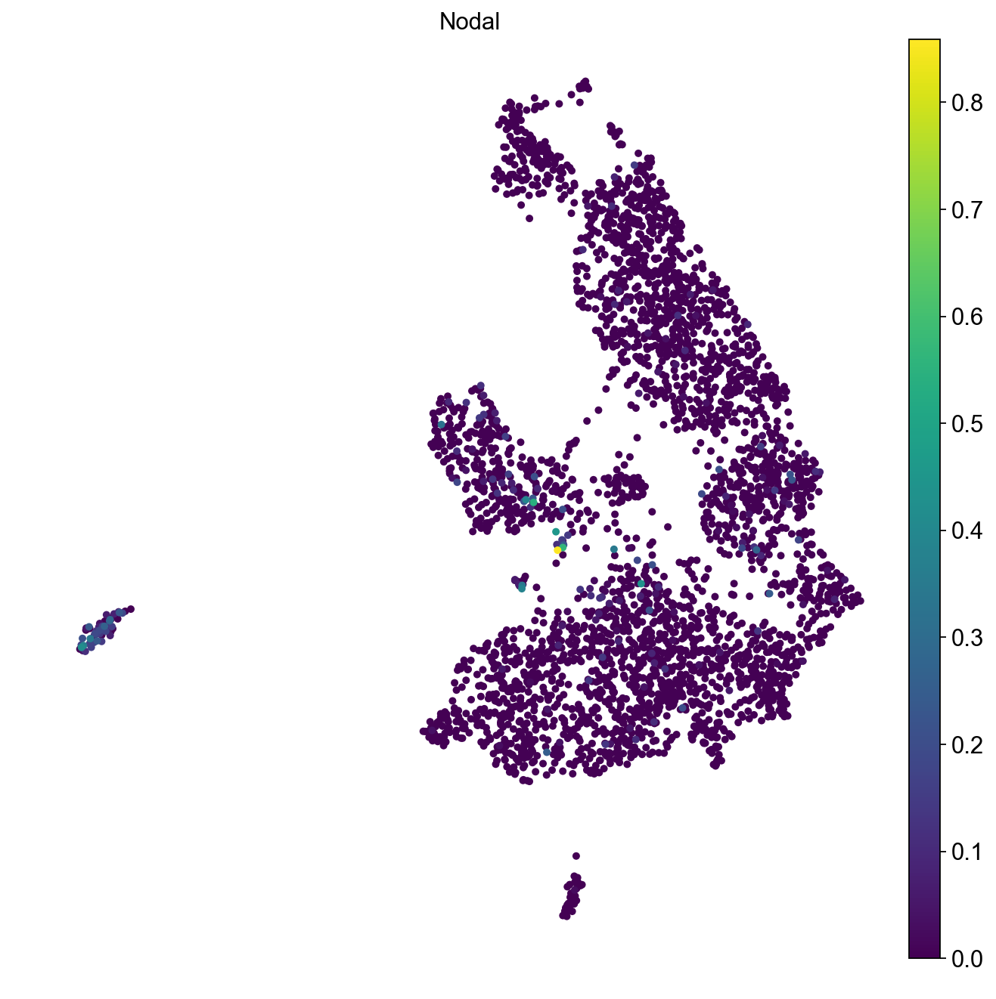

saving figure to file ./figures/umapFoxg1.pdf


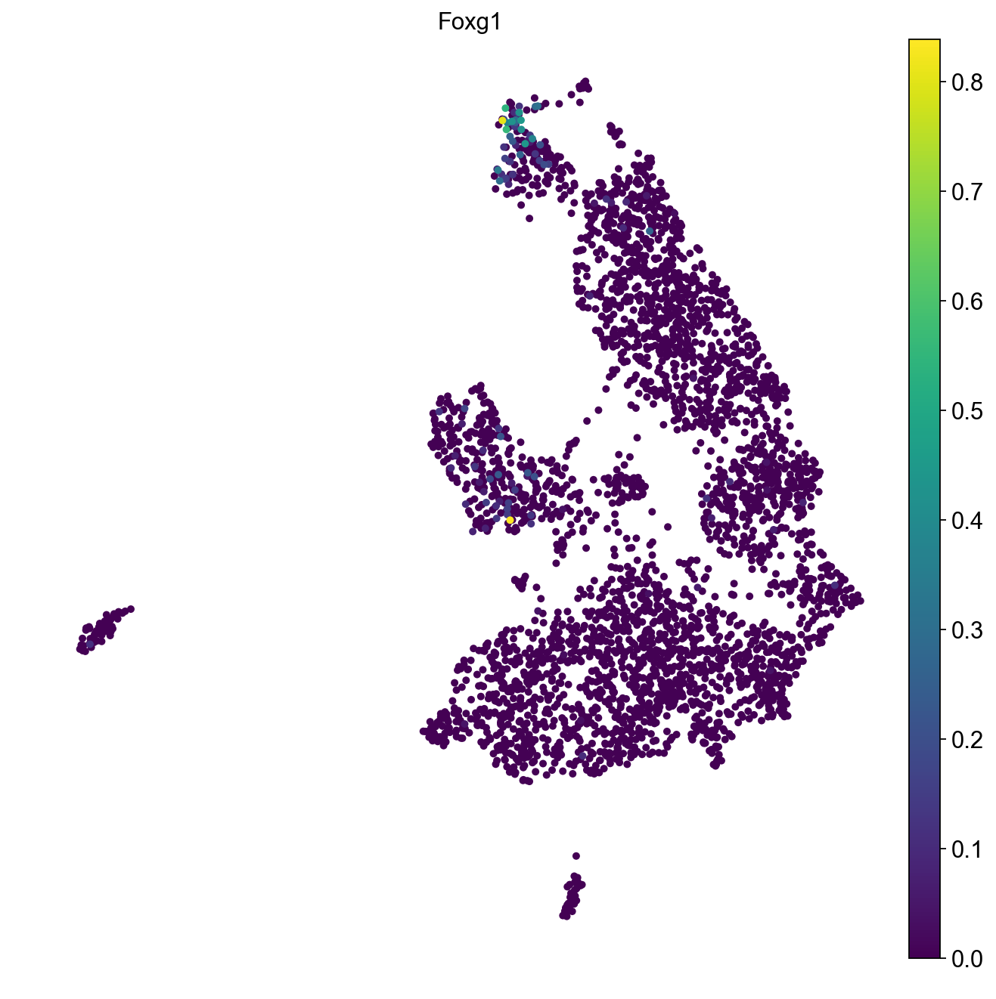

saving figure to file ./figures/umapUncx.pdf


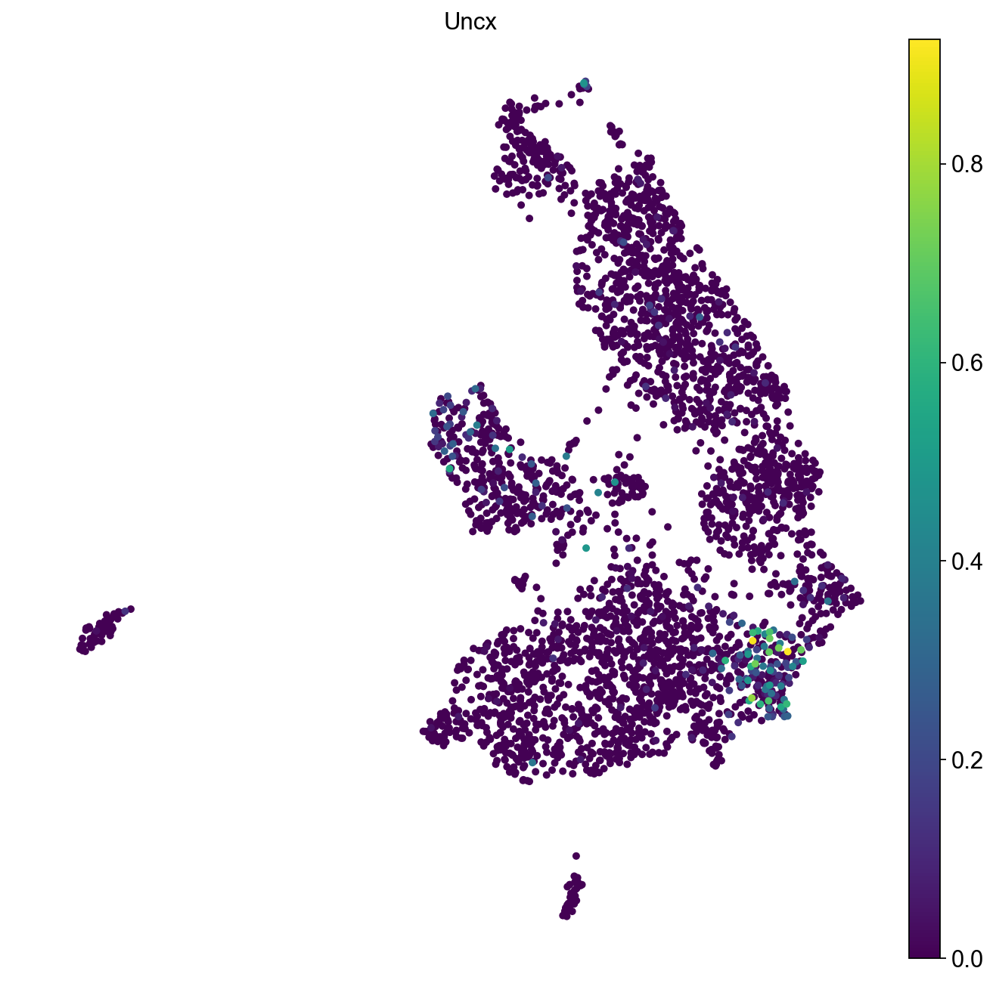

saving figure to file ./figures/umapWnt3a.pdf


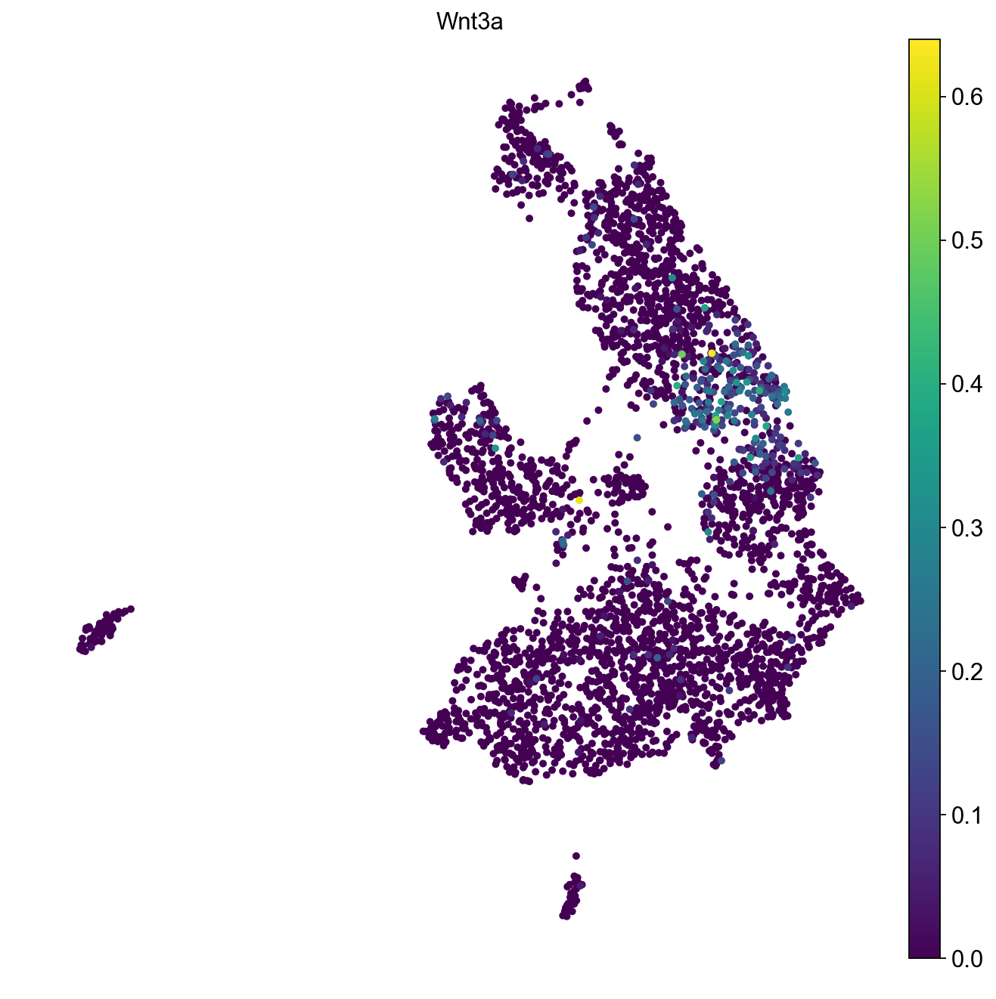

saving figure to file ./figures/umapWnt5a.pdf


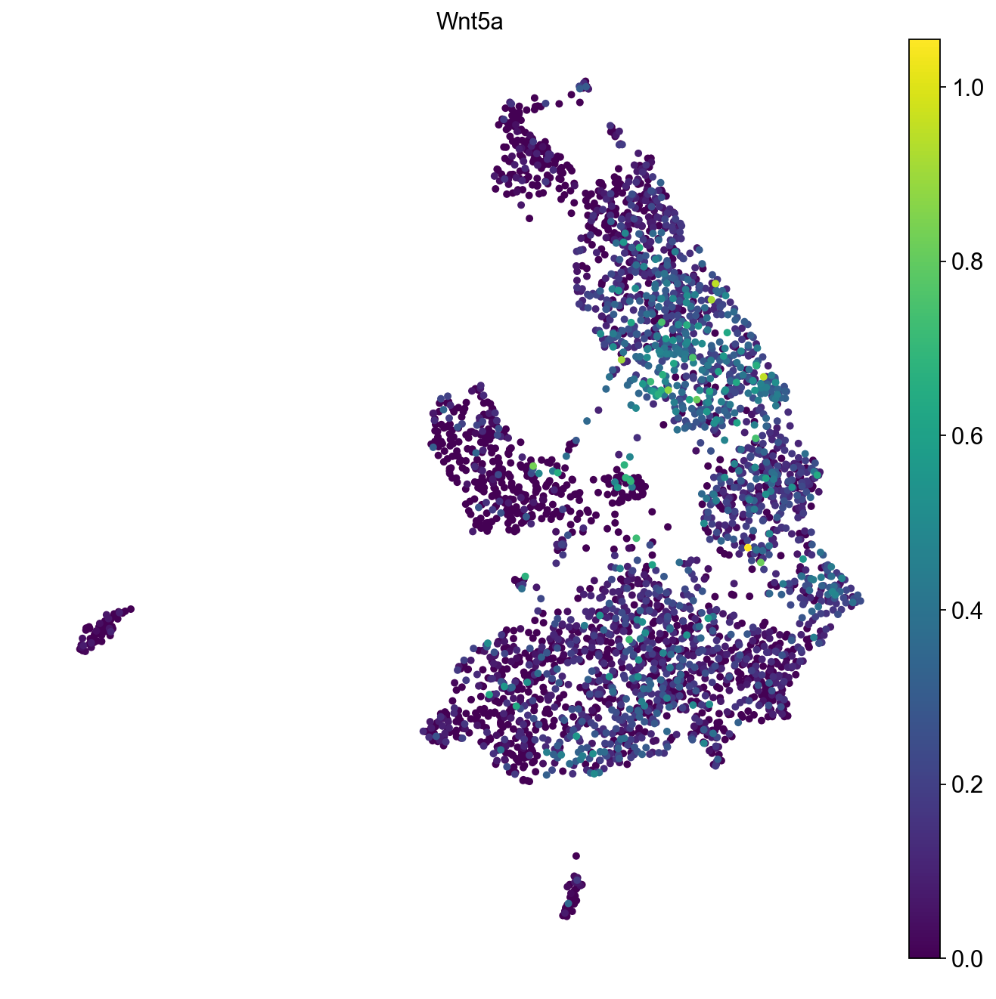

saving figure to file ./figures/umapTbx4.pdf


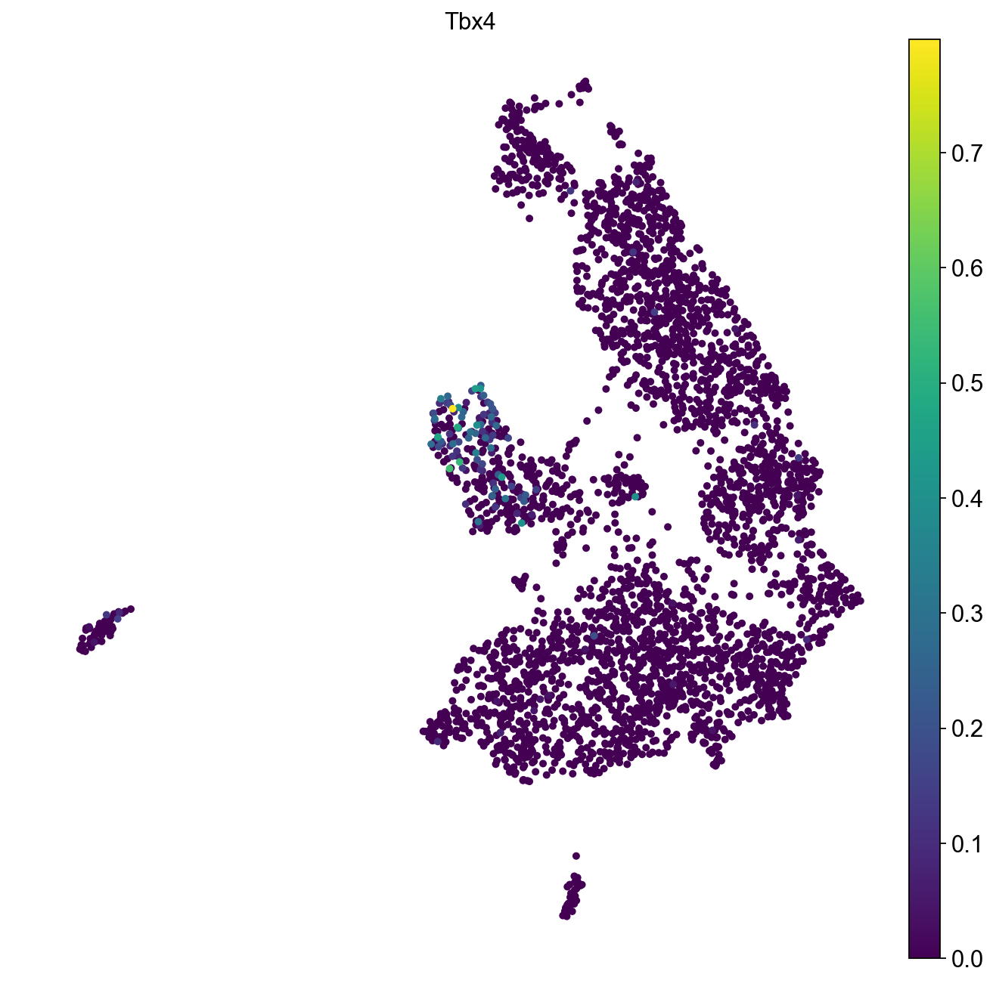

saving figure to file ./figures/umapNanog.pdf


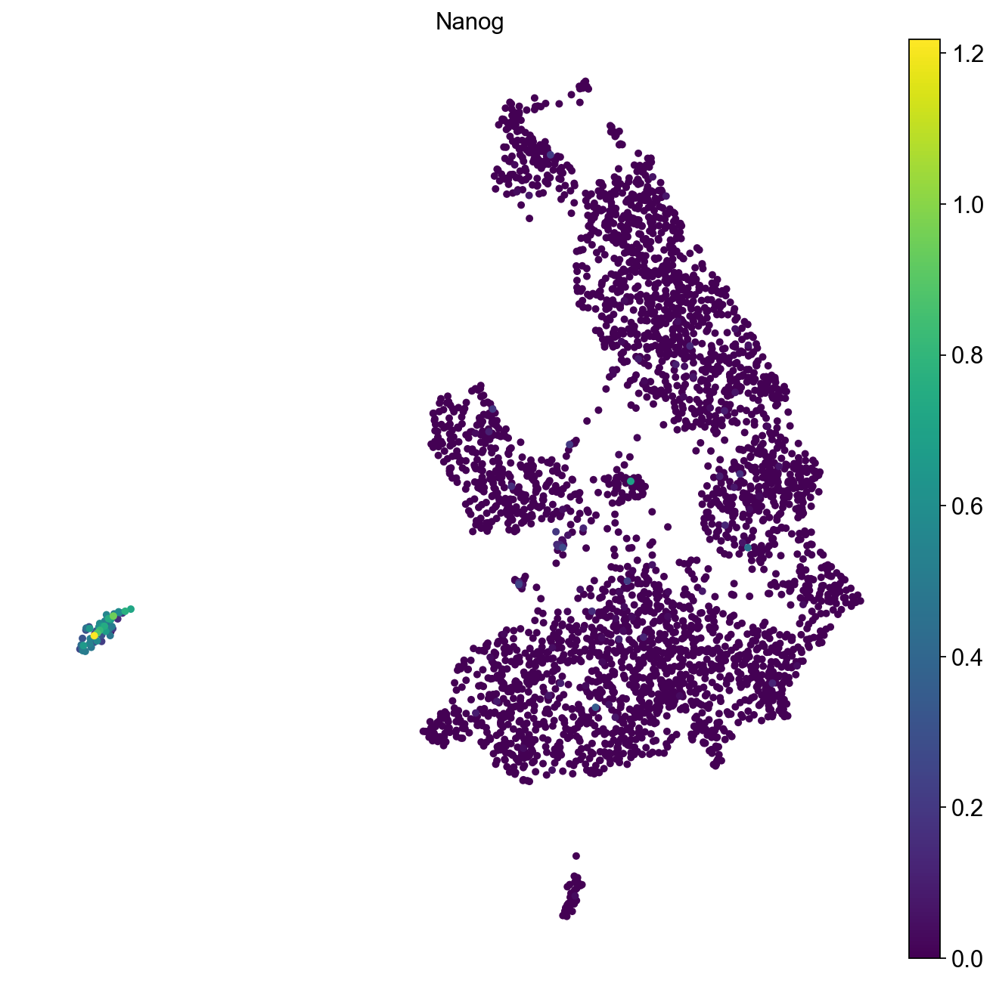

saving figure to file ./figures/umapTrh.pdf


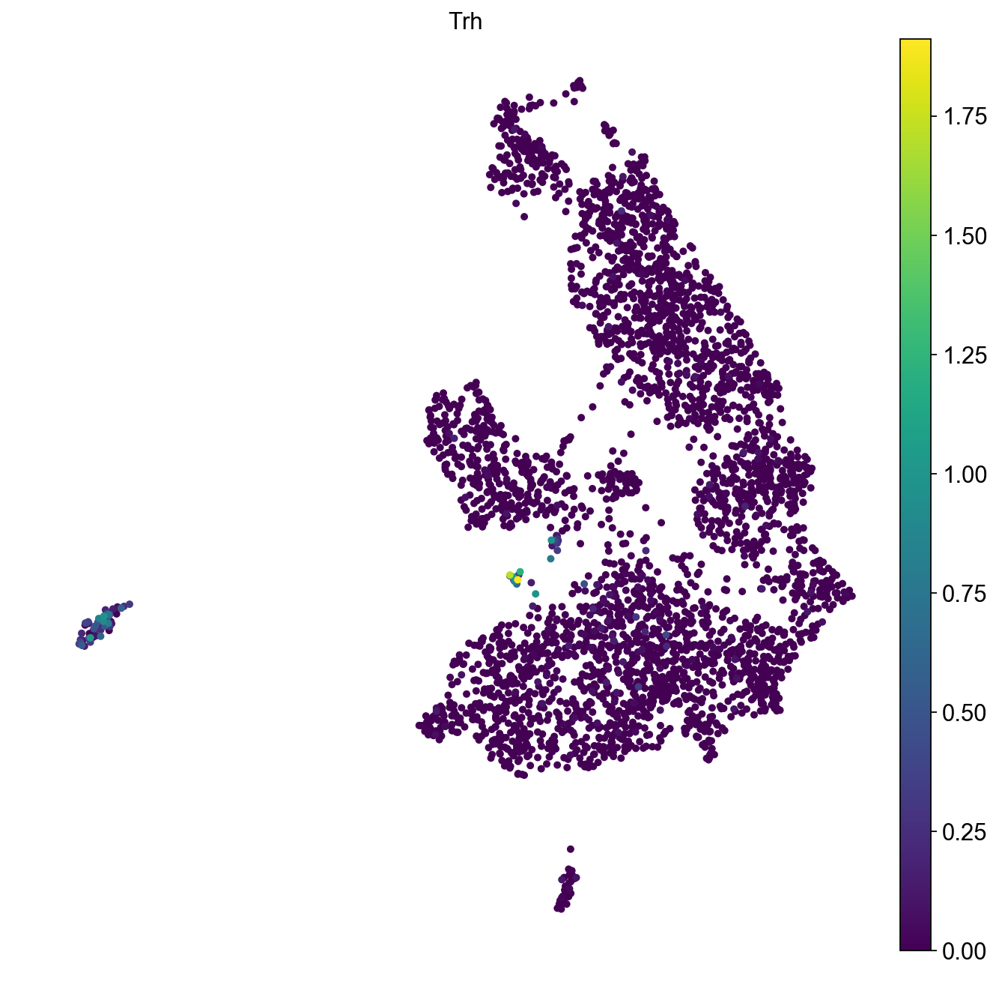

In [115]:
genelist = ['Kdr','Notch1', 'Onecut2', 'Cdx1', 'T', 'Gata6', 'Hand1', 'Hand2', 'Sox1', 'Sox2', 'Cdh1', 'Epcam',
           'Nodal', 'Foxg1', 'Uncx', 'Wnt3a', 'Wnt5a','Tbx4','Nanog','Trh']


for gene in genelist:
    fig,ax = plt.subplots(figsize=(10,10))
    sc.pl.umap(adata, color=gene, use_raw = True,ax=ax,size = 80,frameon=False, save=gene)

Let us also define a list of marker genes for later reference.

In [ ]:
marker_genes = [ 'Prdm1', 'Irx1', 'Sox1', 'Sox2', 'Nkx1-2', 'Bmp4', 'Gata4', 'Gata6', 'Hand1', 'Hand2', 'Runx1t1', 
                'Crabp2', 'Tbx4', 'Dll1', 'Hes7', 'Eya1', 'Pax3', 'Meox1',  'T', 'Wnt3a', 'Cdx2', 'Fgf8', 'Foxg1',
                'Aldh1a2', 'Notch1', 'Cdh1', 'Trh', 'Nanog','Sox7', 'Onecut2', 'Elavl3', 'Tmsb4x']

#Peg3, Prrx1, Prrx2, Pbx1, Meis2, Sox13, Ncam1, Msx1, Nrp1, Peg10, Mdm2, Klf9, Stx3, Cdkn1a, Ccng1, Dll1, Hes7, 
#Rspo3, Dll3, Tbx6, Snai1, Hes5, Dkk1, Lfng, Six1, Cer1, Cadm1, Nav1, Gbx2, Hoxc8, Hoxb9, Hoxc9, Prrx1, Ube2c, 
#Ccnb1, Plk1, Cenpf, Foxb1, Fgf17, Rspo3, Hoxc6, Hoxc8, Hes7, Sox21, Tmsb4x, Epha4, Lfng, Foxc1, Foxc2, Foxp1, 
#Lef1, Mt1, Mt2, Sox17, Epcam, Car2, Kdr, Celsr3, Btbd17, Hes6

If we want a more detailed view for a certain group, use `sc.pl.rank_genes_groups_violin`.

In [ ]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

Reload the object that computed differential expression by comparing to the rest of the groups.

In [ ]:
adata = sc.read(results_file)

In [ ]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

If you want to compare a certain gene across groups, use the following.

In [ ]:
sc.pl.violin(adata, ['Sox1', 'Sox2', 'Foxg1'], groupby='louvain')

Actually mark the cell types.

In [ ]:
new_cluster_names = ['Early endoderm', 'Heart progenitors', '', 'Presomitic mesoderm',
                     '  ', 'Neurons', 'Allantois', 'Early somitic', 'Tailbud', 
                     
                     'Anterior neural / Neurectoderm + branchial arches','Somitogenesis wavefront', 'PGCs + Node ', 
                     ' ','Haemogenic']

adata.rename_categories('louvain', new_cluster_names)

In [ ]:
adata.uns['louvain_colors']

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
sc.pl.umap(adata, color='louvain',ax=ax, palette=sc.pl.palettes.default_20,legend_loc='on data', title='', 
           frameon=False, size = 100)



In [ ]:
adata

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
ax = sc.pl.umap(adata, color='louvain',ax=ax, projection= '2d', 
           palette=['pink','limegreen','orange','steelblue','indianred','red','forestgreen','gold','blue','cyan','palegreen'],
           #['orange', 'red','forestgreen', 'blue', 'orange','forestgreen','pink','steelblue','palegreen','limegreen','cyan','gold', 'pink','Indianred'],
          legend_loc='on data', title='', frameon=False, size = 75,legend_fontsize = 15, legend_fontweight='light')
          #save='umap_treecolours.png')

ax.savefig('/Users/m.blotenburg/Desktop/umap_treecolours.png', dpi=500)
#legend_fontweight : ['light', 'normal', 'medium','semibold', 'bold', 'heavy', 'black']`.

In [ ]:
adata.obsm['X_umap']

In [ ]:
umap_coordinates = adata.obsm['X_umap']
umap_coordinates = pd.DataFrame(umap_coordinates).rename(columns={0:'umap_v1',1:'umap_v2'})
umap_coordinates.index = adata.obs.index
umap_coordinates.head()

In [ ]:
cells_clusters = pd.DataFrame(adata.obs['louvain'])
cells_clusters[['umap_V1','umap_V2']] = umap_coordinates[['umap_v1','umap_v2']]
cells_clusters.head()

In [ ]:
pathToScanpyData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Transcriptome_analysis/120hAA/20190904_CS2pipeOutput_RNAVelocity_VAN2663_VAN2703_VAN2806_VAN3423_OUD3693/CS2pipe_datasets/120hAA/'

cells_clusters = pd.read_csv(pathToScanpyData + 'scanpy_cells_louvainclusters_120hAA.csv')

cells_clusters['cellname'] = cells_clusters['index'].str.split('.',0, expand=True)[0]
cells_clusters['gastruloid'] = cells_clusters['index'].str.split('.',0, expand=True)[1]
cells_clusters.index = cells_clusters['cellname']

louvain_colors = {'Early endoderm1':'orange', 'Early heart progenitors':'red', 'Neurons1':'green', 
                  'Presomitic mesoderm':'blue','Early endoderm2': 'orange', 'Neurons2':'green',
                  'Allantois (?)':'pink', 'Early somitic':'navy', 'Tailbud':'palegreen', 
                  'Anterior neural / Neurectoderm + branchial arches':'limegreen','Somitogenesis wavefront':'cyan',
                  'PGCs + Node ':'gold', '?':'pink','Haemogenic':'maroon'}

cells_clusters['louvain_colors'] = [louvain_colors[x] for x in cells_clusters['louvain']]

cells_clusters.head()

In [ ]:
import seaborn as sns 
sns.set_style("white")
plt.figure(figsize=(8,8))
sns.scatterplot(cells_clusters['umap_V1'], cells_clusters['umap_V2'], hue = cells_clusters['louvain_colors'])

In [ ]:
plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5F10']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5F10']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5F10')


plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5A9']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5A9']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5A9')

plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5B10']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5B10']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5B10')

plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5C6']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5C6']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5C6')

plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5G7']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5G7']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5G7')


plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5H11']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5H11']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5H11')

plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5H7']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5H7']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5H7')

plt.figure(figsize=(8,8))
fig = plt.scatter(cells_clusters['umap_V1'], cells_clusters['umap_V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
fig = plt.scatter(cells_clusters[cells_clusters['gastruloid'] == 'C5H9']['umap_V1'], 
                cells_clusters[cells_clusters['gastruloid'] == 'C5H9']['umap_V2'],c = [(0,0,0)],zorder=10,
                  edgecolor = 'grey')
fig = plt.title('C5H9')

Now that we annotated the cell types, let us visualize the marker genes.

In [ ]:
adata2 = adata

In [ ]:
new_cluster_names = ['Early endoderm', 'Heart progenitors', 'Neurons', 'Presomitic mesoderm',
                     'Endoderm', 'Neuron', 'Allantois', 'Early somitic', 'Tailbud', 
                     
                     'Anterior neural / Neurectoderm + branchial arches','Somitogenesis wavefront', 'PGCs + Node ', 
                     '?','Haemogenic']

adata2.rename_categories('louvain', new_cluster_names)

In [ ]:
louvain_names = {'Early endoderm':'Early endoderm', 'Heart progenitors':'Heart progenitors', 'Neurons':'Neurons',
                  'Presomitic mesoderm':'Presomitic mesoderm','Endoderm':'Early endoderm', 
                  'Neuron':'Neurons', 'Allantois':'Allantois', 'Early somitic':'Early somitic', 'Tailbud':'Tailbud', 
                     'Anterior neural / Neurectoderm + branchial arches':'Anterior neural / Neurectoderm + branchial arches',
                  'Somitogenesis wavefront':'Somitogenesis wavefront', 'PGCs + Node ':'PGCs + Node', 
                     '?':'Allantois','Haemogenic':'Haemogenic'}

adata2.obs['louvain'] = [louvain_names[x] for x in adata2.obs['louvain']]

In [ ]:
adata2

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
sc.pl.umap(adata2, color='louvain',ax=ax, projection= '2d', 
           palette=['pink','limegreen','orange','steelblue','indianred','red','forestgreen','gold','blue','cyan','palegreen'],
          legend_loc='on data', title='', frameon=False, size = 75,legend_fontsize = 15, legend_fontweight='light'
          )


#legend_fontweight : ['light', 'normal', 'medium','semibold', 'bold', 'heavy', 'black']`.

In [ ]:
sc.tl.rank_genes_groups(adata2, 'louvain', method='logreg')
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False)
pd.DataFrame(adata2.uns['rank_genes_groups']['names']).head(10)

In [ ]:
marker_genes = [ 'Ass1',#allantois
         'Crabp1',#anterior neural
'Sox1', 'Sox2','Nkx1-2',#neuron
    'Irx5','Irx1','Prdm1','Emb','Meis2',#early endoderm
    'Pax3', 'Meox1','Pax3',#early somitic
        'Kdr', 'Car2','Hand1', 'Hand2', 'Gata4', 'Gata6','Bmp4', #heart, haemogenic

    'Nanog','Epcam','Cdh1','Trh','Mt1','Ephx2',#PGC/node
    'Dll1','Tbx6',#presomitic
                'Notch1','Aldh1a2','Lfng',#somites
                'Hes7','T','Wnt3a','Cdx2','Fgf17','Fgf8' #Tailbud
                
            
            ]


ax = sc.pl.dotplot(adata2, marker_genes, groupby='louvain'  ,save='dotplot_markergenes.png')

In [ ]:
sc.pl.umap(adata2, color=['Pax3','Sox11','Meis2','Emb'], use_raw = True)

There is also a very compact violin plot.

In [ ]:
ax = sc.pl.stacked_violin(adata, marker_genes, groupby='louvain', rotation=90)

In [ ]:
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=6, key='rank_genes_groups')

During the course of this analysis, the AnnData accumlated the following annotations.

In [ ]:
adata

In [ ]:
adata.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations.

In [ ]:
adata.X = None
adata.write('./write/pbmc3k_withoutX.h5ad', compression='gzip')

If you want to export to "csv", you have the following options:

In [ ]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )